In [2]:
import numpy as np
import pyuvdata
import sys
sys.path.append("/opt/devel/rbyrne/rlb_LWA/LWA_data_preprocessing")
import LWA_calibrate
import smooth_cal_solutions
import importlib
importlib.reload(smooth_cal_solutions)
from calico import calibration_qa
import matplotlib.pyplot as plt
import scipy

/opt/devel/rbyrne/envs/py311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-07-24 22:26:05,490	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


In [3]:
uv = pyuvdata.UVData()
uv.read("/lustre/pipeline/cosmology/concatenated_data/44MHz/2026-04-19/05/20260419_055641-055832_44MHz.ms")

In [4]:
uv.flag_array[np.where(uv.data_array == 0)] = True

In [5]:
cal_orig = LWA_calibrate.read_caltable("/fast/rbyrne/calibration_2026-04-19_17h.B.flagged")
cal_orig.select(frequencies=uv.freq_array)

Setting telescope_location to value in known_telescopes for OVRO-LWA.
Unknown polarization basis for solutions, jones_array values may be spurious.
Unknown x_orientation basis for solutions, assuming "east".


In [32]:
def polynomial_smooth(x, y, deg=1):
    idx = np.isfinite(x) & np.isfinite(y)
    if np.sum(idx) > 0:
        fit_coeffs = np.polyfit(x[idx], y[idx], deg)
        polyfit_function = np.poly1d(fit_coeffs)
        y_smoothed = polyfit_function(x)
        return y_smoothed
    else:
        return np.full_like(y, np.nan)

def detrend(x, y, deg=1):
    y_smoothed = polynomial_smooth(x, y, deg=deg)
    y_new = y - y_smoothed
    return y_new

def flag(y, sigma_threshold=4, detrend_deg=4):
    y_smoothed = detrend(np.arange(len(y)), y, deg=detrend_deg)
    y[np.where(np.abs(np.abs(y_smoothed - np.nanmean(y_smoothed)) > sigma_threshold * np.nanstd(y_smoothed)))] = np.nan 
    return y

def convolve(y, width=5, even_ok=False):
    if not even_ok:
        if width%2 == 0:
            print("ERROR: width must be odd.")
            sys.exit()
    window = scipy.signal.windows.blackmanharris(width)
    padding_size = int(np.floor(width/2))
    signal_padded = np.full(len(y) + 2 * padding_size, np.nan)
    signal_padded[padding_size:-padding_size] = y
    signal_masked = np.isfinite(signal_padded)
    convolved_signal = np.zeros_like(y)
    for ind in range(len(y)):
        convolved_signal[ind] = np.nansum(signal_padded[ind:width + ind] * window) / np.nansum(signal_masked[ind:width + ind] * window)
    return convolved_signal

In [22]:
scipy.signal.windows.blackmanharris(2)

array([6.e-05, 6.e-05])

In [34]:
print(gains_squared[0:10])
print(convolve(gains_squared, width=5)[0:10])

[1.01042416e-05 9.60580910e-06 9.69215874e-06 9.05881935e-06
 9.34490955e-06 9.39997492e-06 9.22331529e-06 9.17442642e-06
 9.33555477e-06 9.24452294e-06]
[1.00151934e-05 9.69440823e-06 9.58309927e-06 9.19818749e-06
 9.30990932e-06 9.36483545e-06 9.24268754e-06 9.20626494e-06
 9.29733275e-06 9.25475122e-06]


In [7]:
cal_single_ant = cal_orig.select(antenna_names=["LWA255"], jones=[-5], inplace=False)

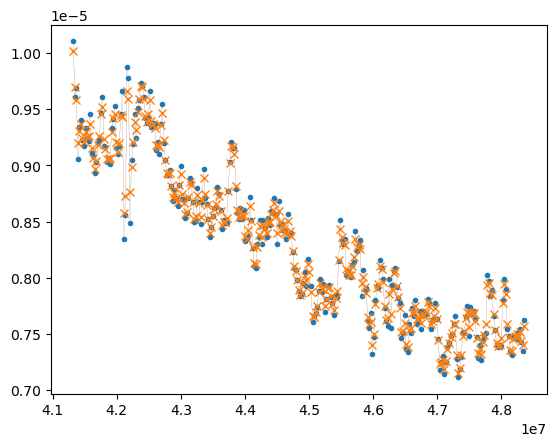

In [39]:
gains_squared = np.abs(cal_single_ant.gain_array[0,:,0,0])**2
gains_squared = flag(gains_squared)
plt.plot(cal_single_ant.freq_array, gains_squared, ".-", linewidth=.1)
plt.plot(cal_single_ant.freq_array, convolve(gains_squared, width=5), "x-", linewidth=.1)

In [ ]:
def update_cal_with_autocorrs(cal_orig, uv, deg=3):
    uv.scan_number_array = None
    uv.select(ant_str="auto", inplace=True)
    if uv.Ntimes > 1:
        uv.downsample_in_time(n_times_to_avg=uv.Ntimes)
    cal_orig.select(frequencies=uv.freq_array, inplace=True)
    cal_new = cal_orig.copy()

    for pol_ind, pol in enumerate(cal_orig.jones_array):
        for ant_name in uv.telescope.antenna_names:
            cal_single_ant = cal_orig.select(antenna_names=[ant_name], jones=[pol], inplace=False)
            uv_single_ant = uv.select(antenna_names=[ant_name], polarizations=[pol], inplace=False)

            gains_squared = np.abs(cal_single_ant.gain_array[0,:,0,0])**2
            autocorrs_inv = 1/np.abs(uv_single_ant.data_array[0, :, 0])
            freqs_mhz = uv.freq_array / 1e6

            autocorrs_flagged = flag(autocorrs_inv)
            autocorr_inv_detrended = detrend(freqs_mhz, autocorrs_flagged, deg=deg)
            gains_squared_detrended = detrend(freqs_mhz, gains_squared, deg=deg)
            autocorr_inv_detrended_rescaled = autocorr_inv_detrended*np.nanstd(gains_squared_detrended)/np.nanstd(autocorr_inv_detrended)

            gains_squared_new = gains_squared - gains_squared_detrended + autocorr_inv_detrended_rescaled
            gains_new = cal_single_ant.gain_array[0,:,0,0] / np.abs(cal_single_ant.gain_array[0,:,0,0]) * np.sqrt(gains_squared_new)
            
            antenna_number = cal_orig.telescope.antenna_numbers[np.where(np.array(cal_orig.telescope.antenna_names) == ant_name)][0]
            antenna_ind = np.where(cal_orig.ant_array == antenna_number)
            cal_new.gain_array[antenna_ind, :, 0, pol_ind] = gains_new

    # There are issues when nans exist in the caltable
    cal_new.flag_array[np.where(~np.isfinite(cal_new.gain_array))] = True
    cal_new.gain_array[np.where(~np.isfinite(cal_new.gain_array))] = 1.0 + 0*1j

    return cal_new

In [40]:
def smooth_cal_with_convolution(cal_orig, freq_array, width=5):

    cal_new = cal_orig.copy()
    cal_new.gain_array[np.where(cal_new.flag_array)] = np.nan + 1j * np.nan
    cal_new = smooth_cal_solutions.smooth_cal(cal_new, amp_deg=None, phase_deg=1, freq_array_hz=freq_array)  # Fit phases
    for ant_ind in range(cal_new.Nants_data):
        for time_ind in range(cal_new.Ntimes):
            for pol_ind in range(cal_new.Njones):
                gain_amp_orig = np.abs(cal_new.gain_array[ant_ind, :, time_ind, pol_ind])
                gain_amp_orig = flag(gain_amp_orig)
                gain_amp_smoothed = convolve(gain_amp_orig, width=width)
                cal_new.gain_array[ant_ind, :, time_ind, pol_ind] *= gain_amp_smoothed / gain_amp_orig

    cal_new.flag_array[np.where(~np.isfinite(cal_new.gain_array))] = True

    return cal_new

In [41]:
for width in [5, 7, 9, 21]:
    cal_new = smooth_cal_with_convolution(cal_orig, uv.freq_array, width=width)
    cal_new.write_calfits(f"/fast/rbyrne/calibration_2026-04-19_17h_smoothed_bh{width}.calfits", clobber=True)

invalid value encountered in arccos
Mean of empty slice
Degrees of freedom <= 0 for slice.
invalid value encountered in scalar divide
The calfits format does not support recording optional phase center, scan number, or time-varying reference antenna information, and these information will not be included in the written file.
key CASA_Version in extra_keywords is longer than 8 characters. It will be truncated to 8 as required by the calfits file format.


In [39]:
cal_new = update_cal_with_autocorrs(cal_orig, uv)

Degrees of freedom <= 0 for slice.
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in 

In [40]:
cal_new.write_calfits("/lustre/rbyrne/2026-04-19/20260419_055641-055832_44MHz_autocorr.calfits", clobber=True)

The calfits format does not support recording optional phase center, scan number, or time-varying reference antenna information, and these information will not be included in the written file.
key CASA_Version in extra_keywords is longer than 8 characters. It will be truncated to 8 as required by the calfits file format.


Mean of empty slice
Mean of empty slice


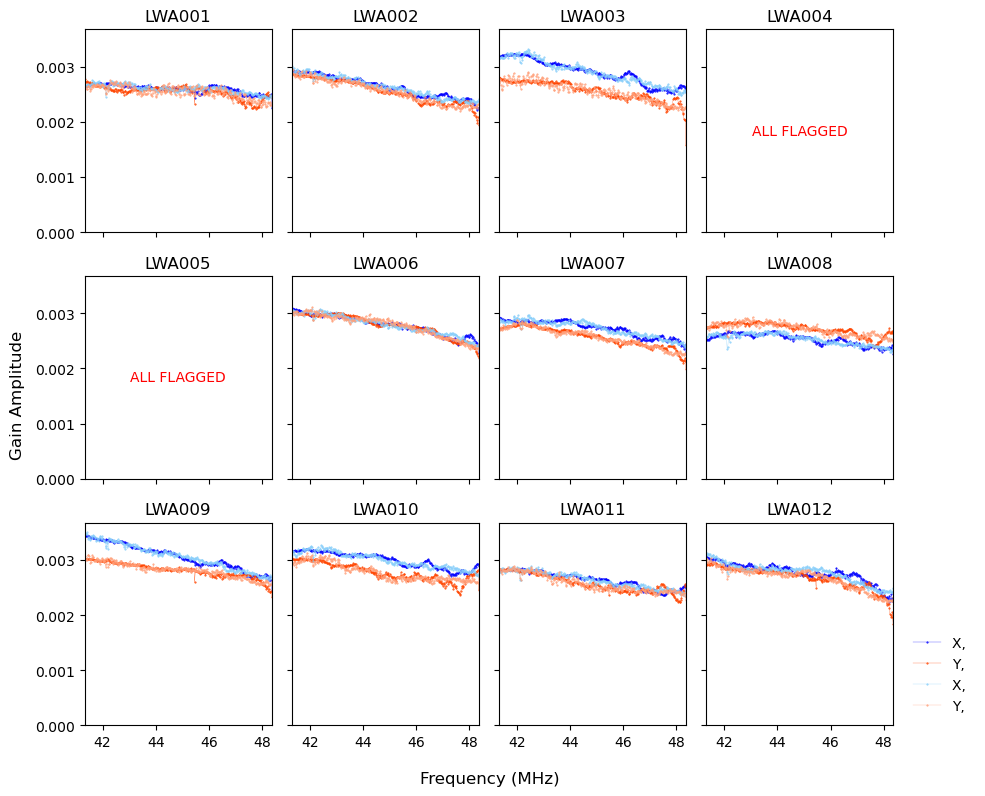

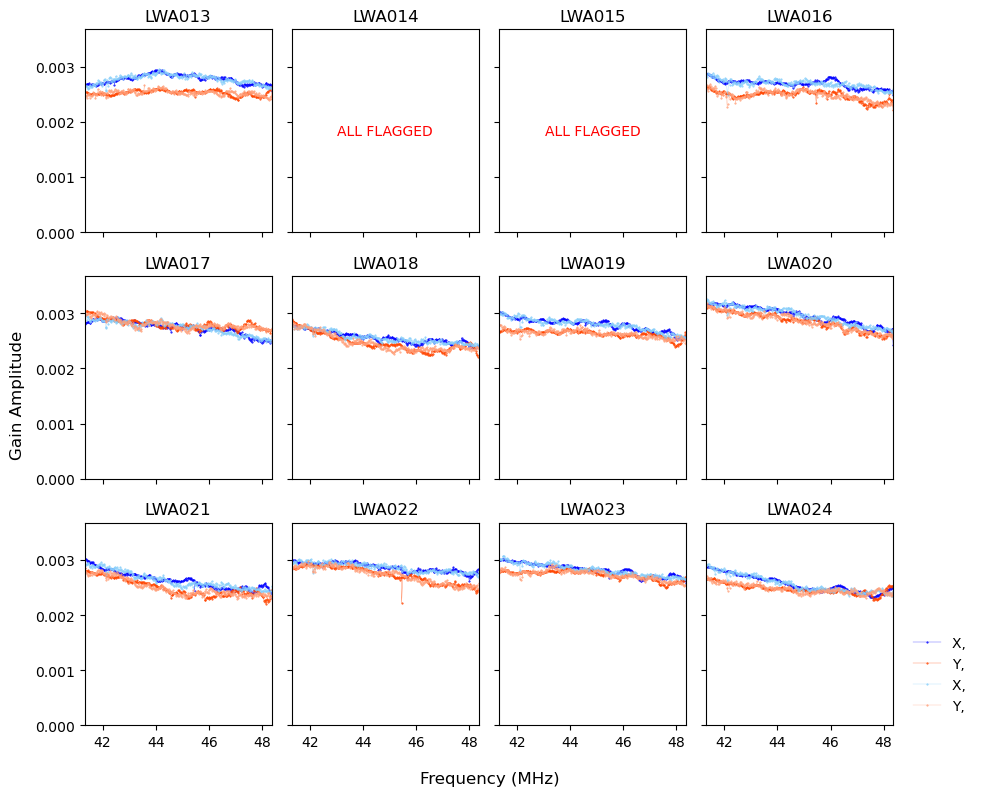

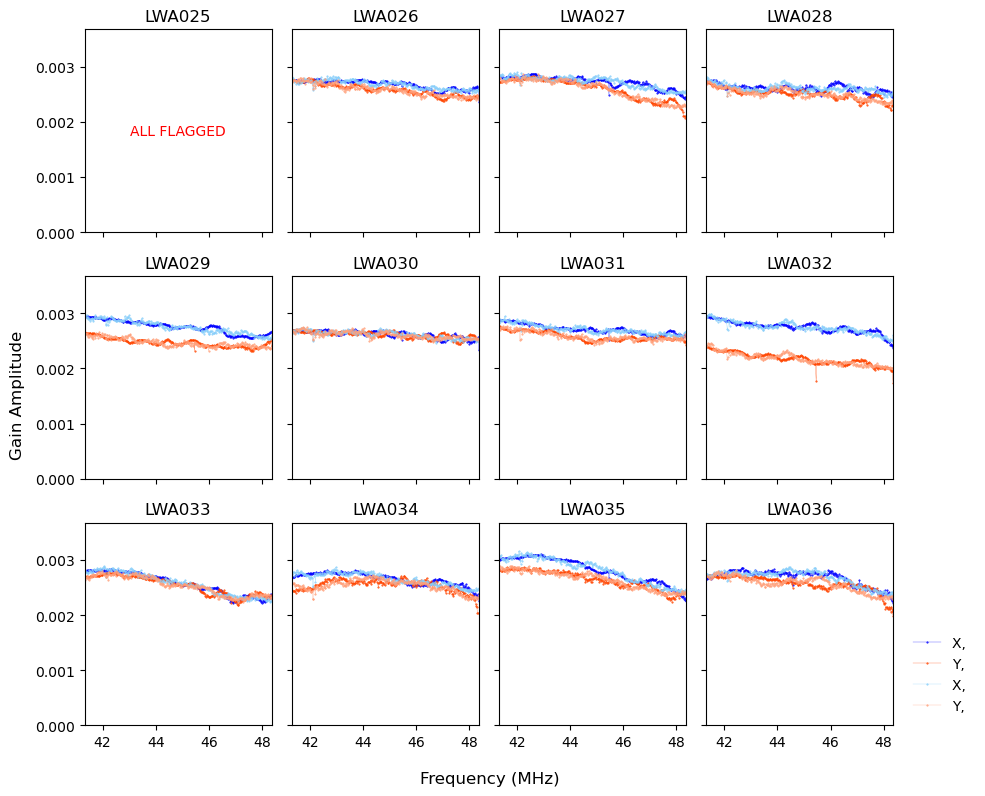

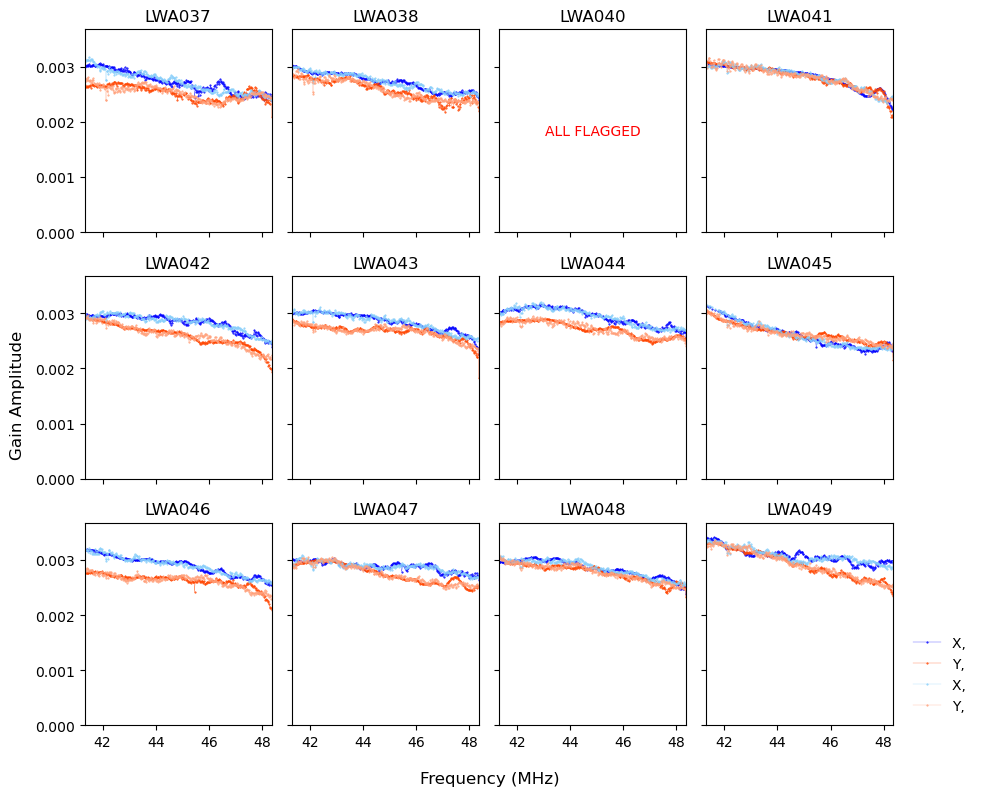

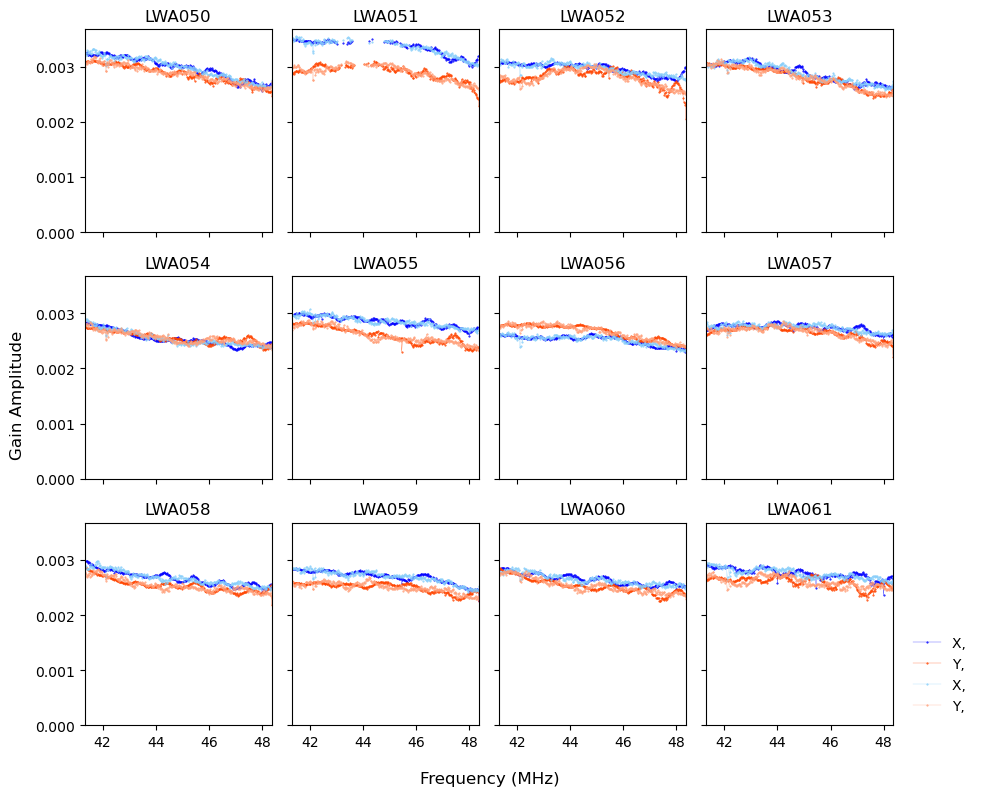

...

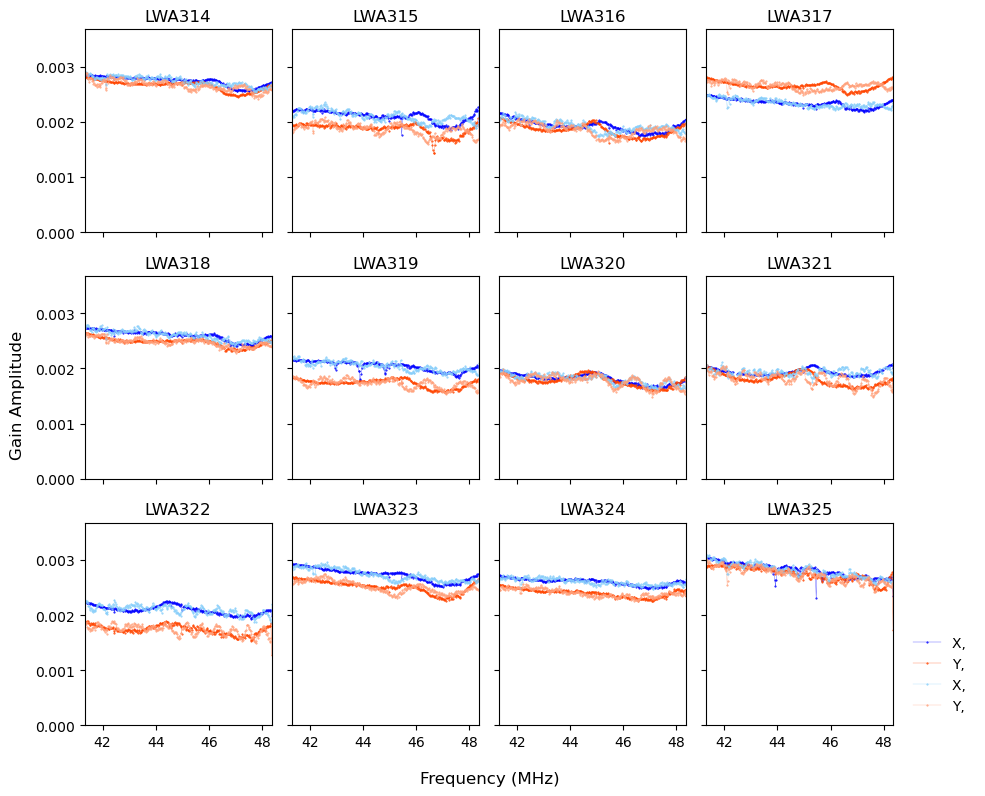

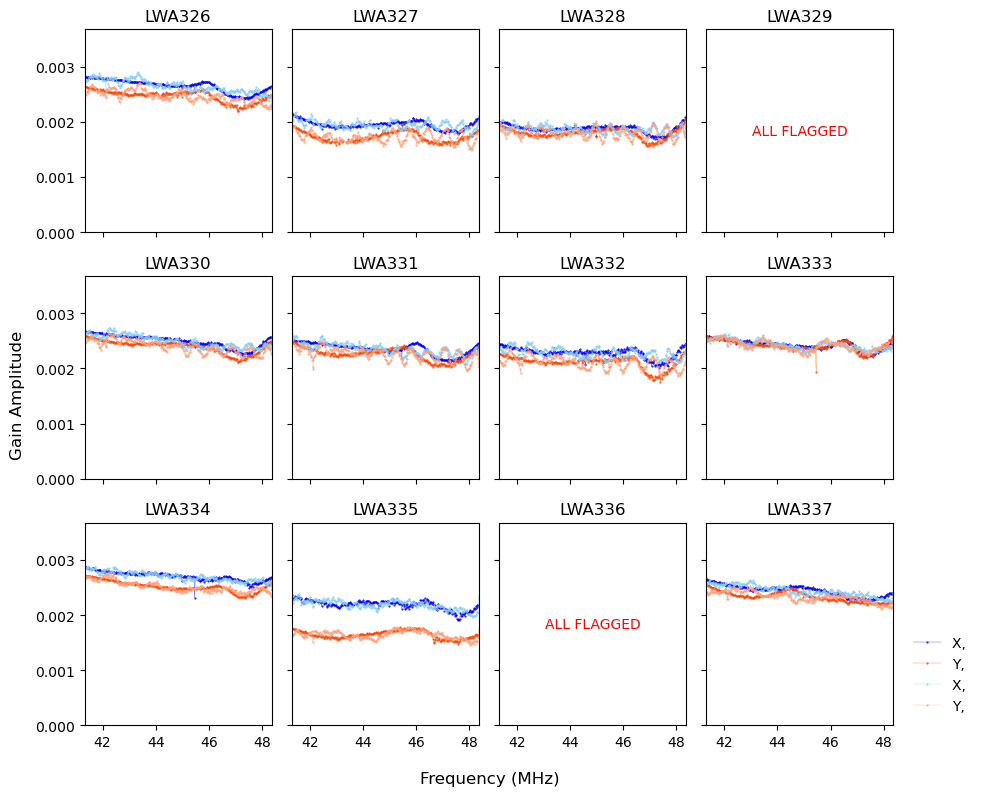

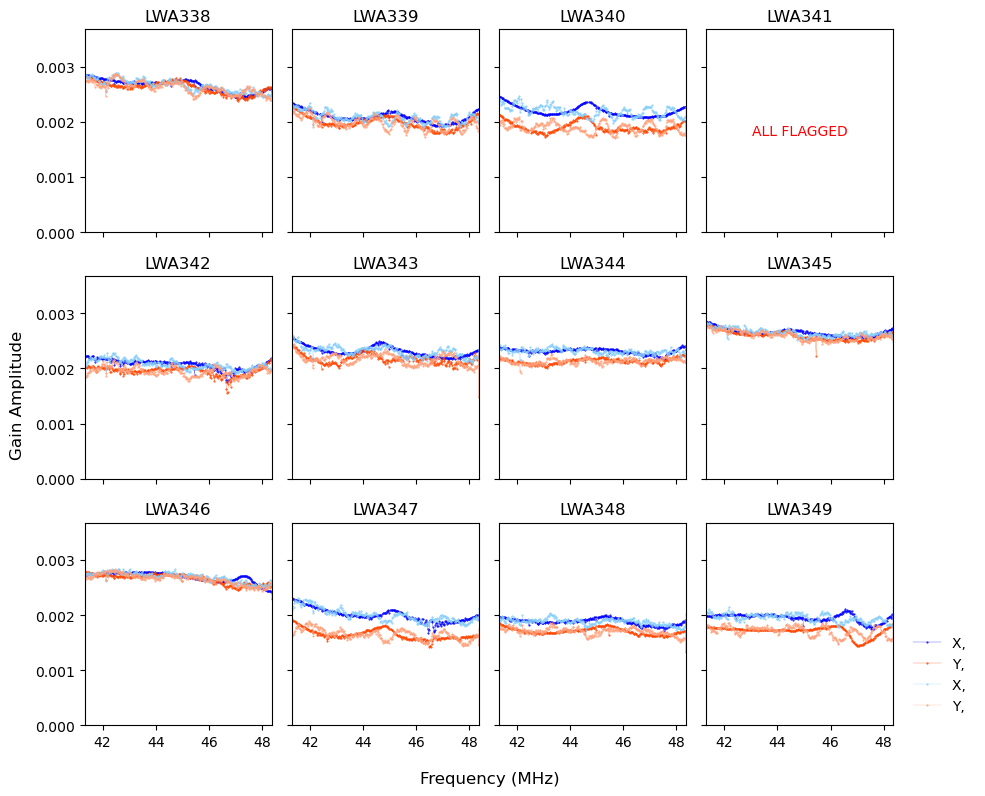

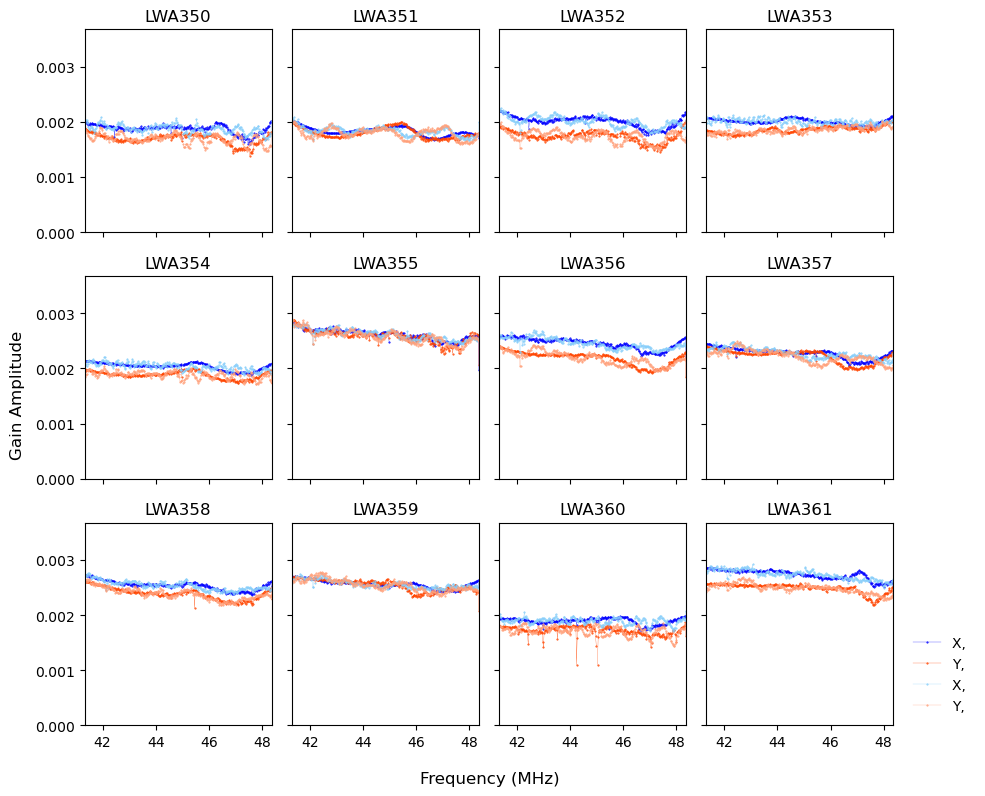

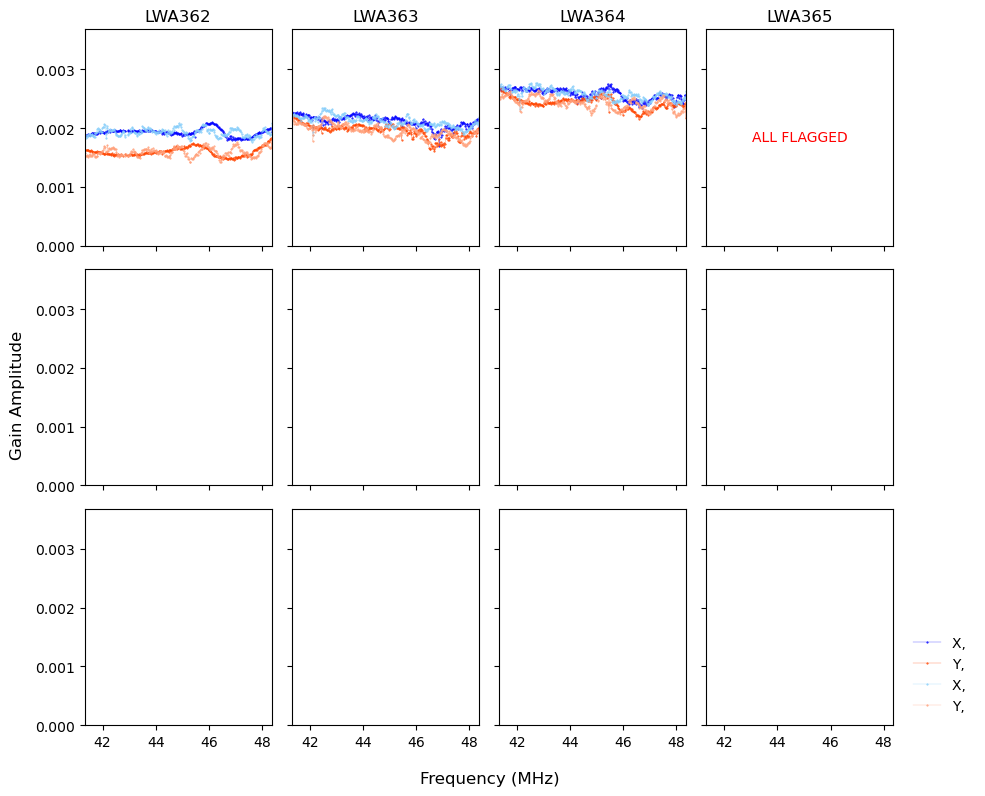

Mean of empty slice
Mean of empty slice


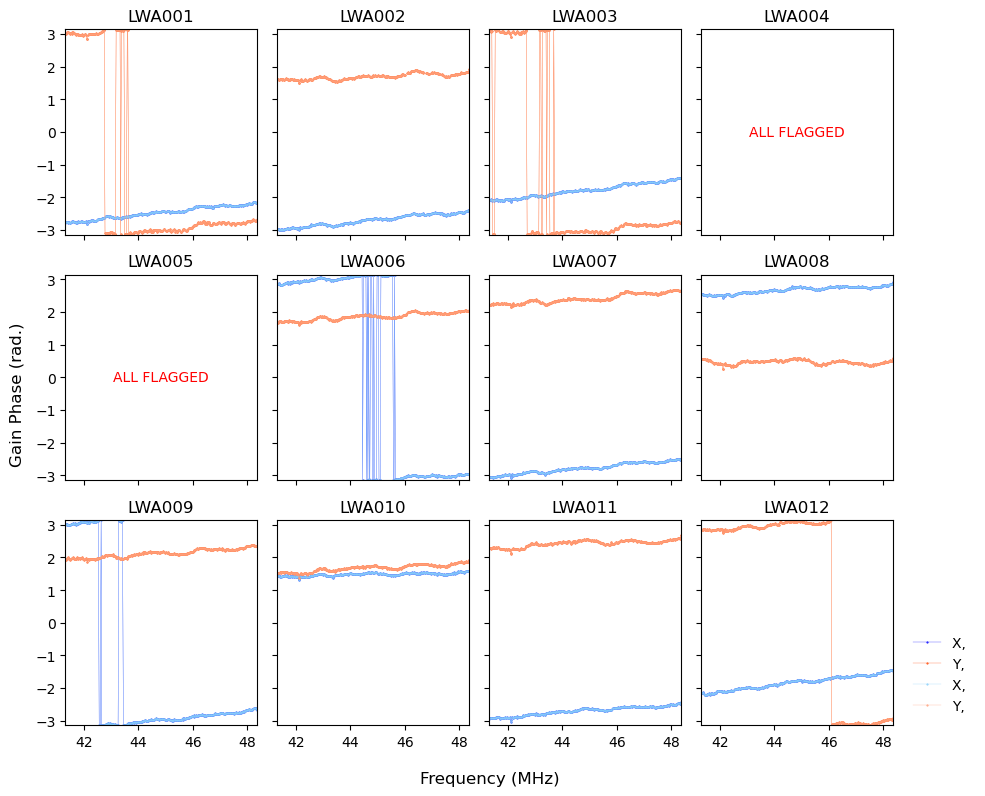

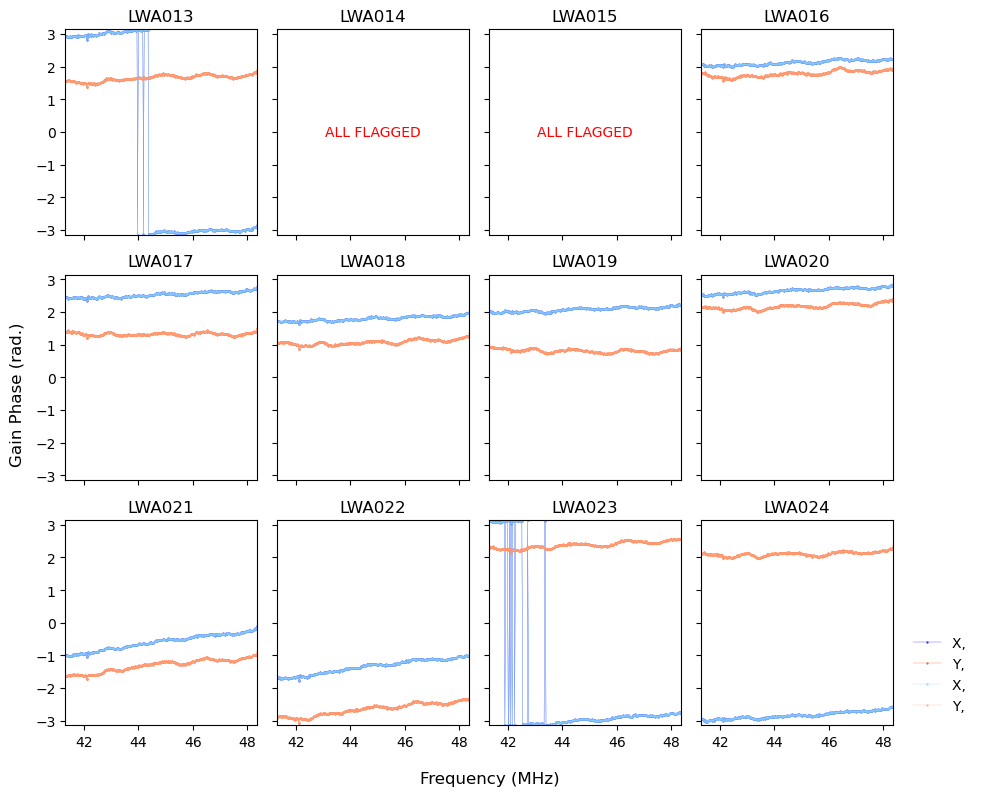

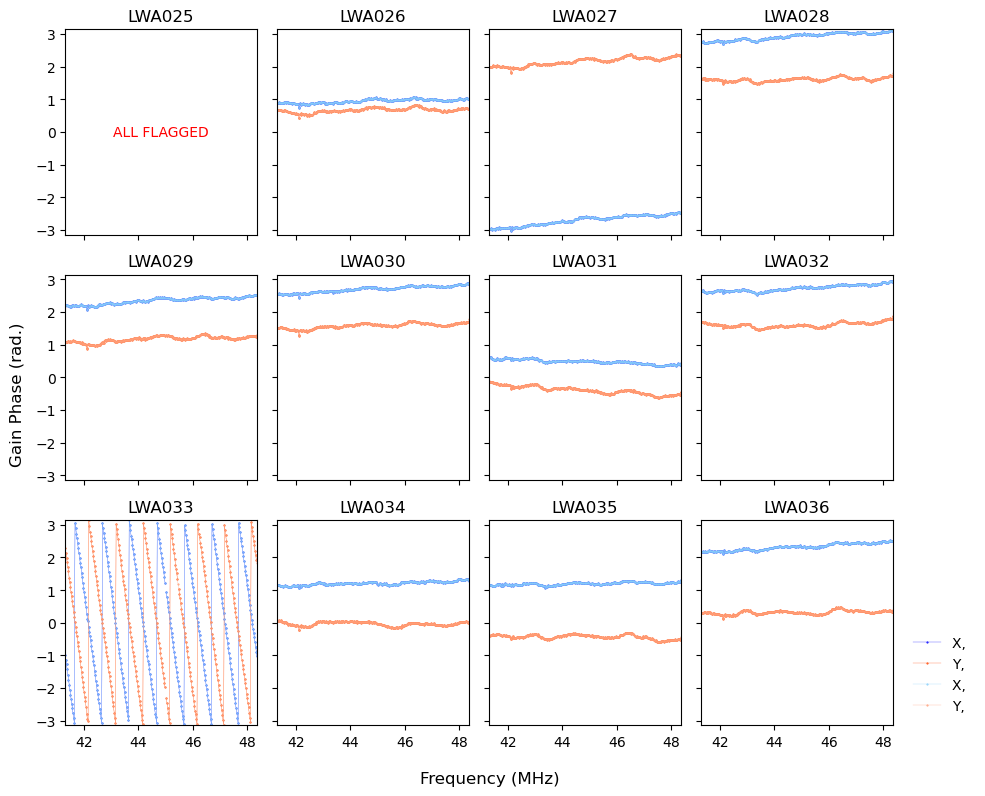

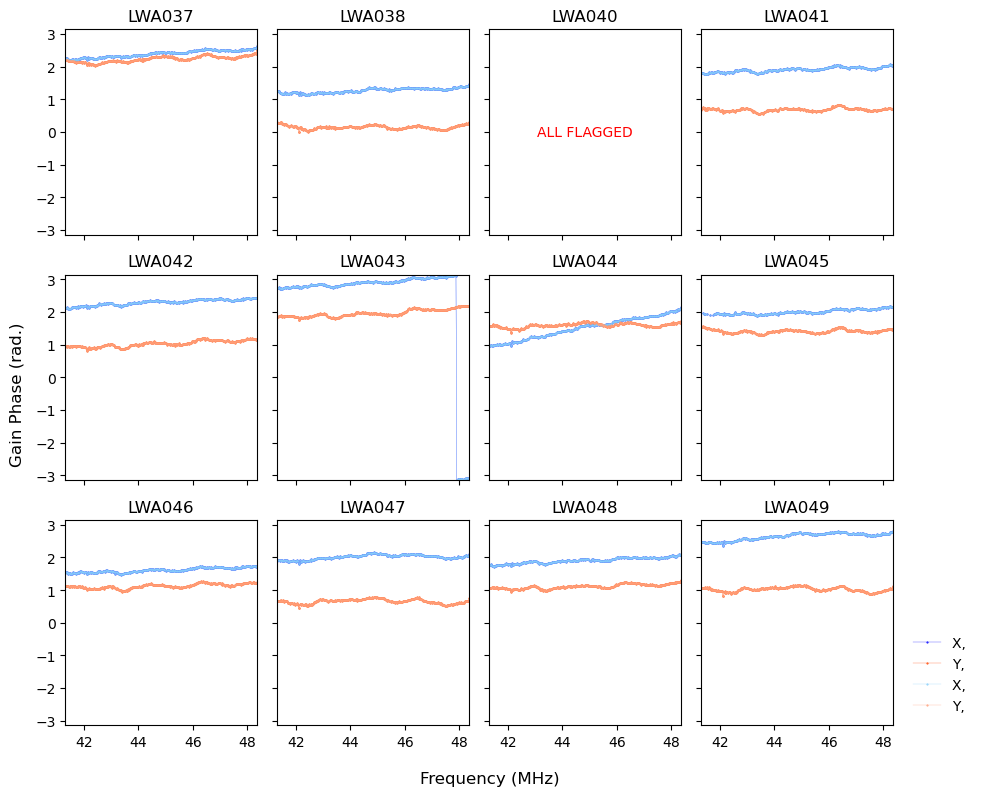

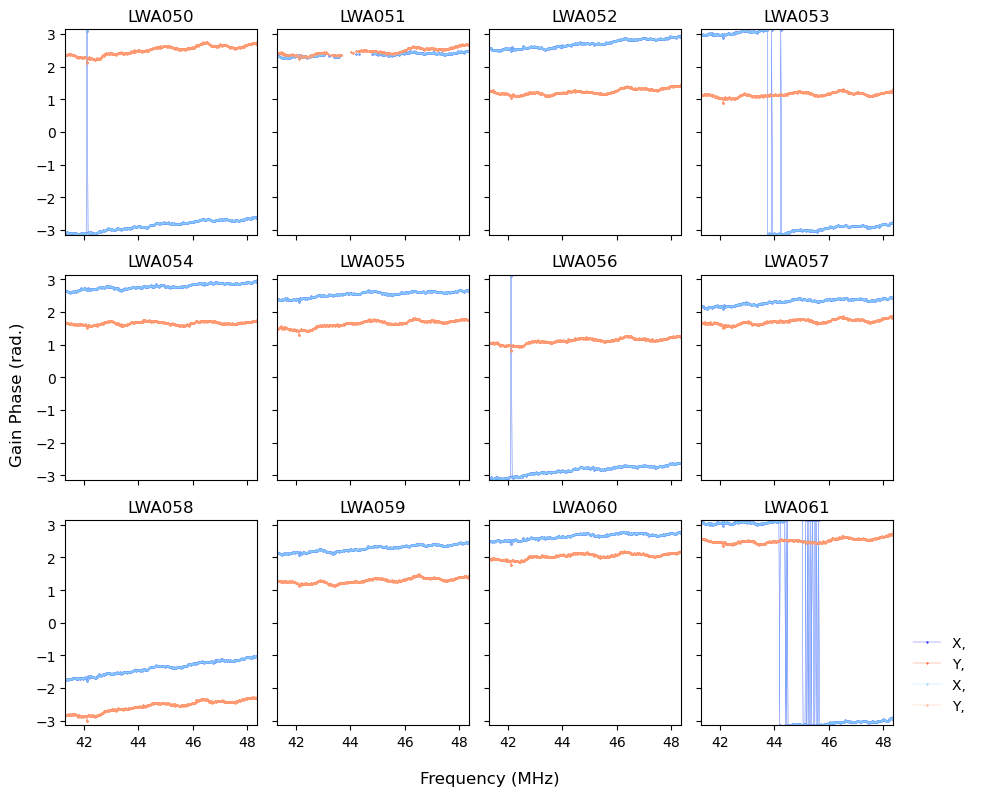

...

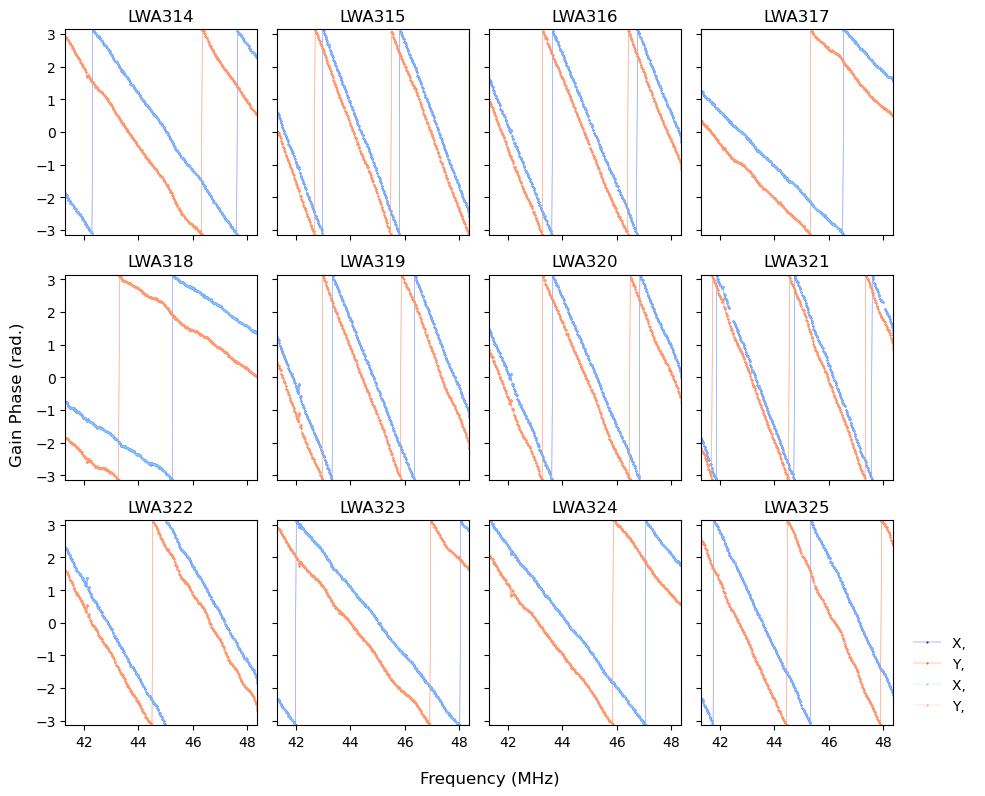

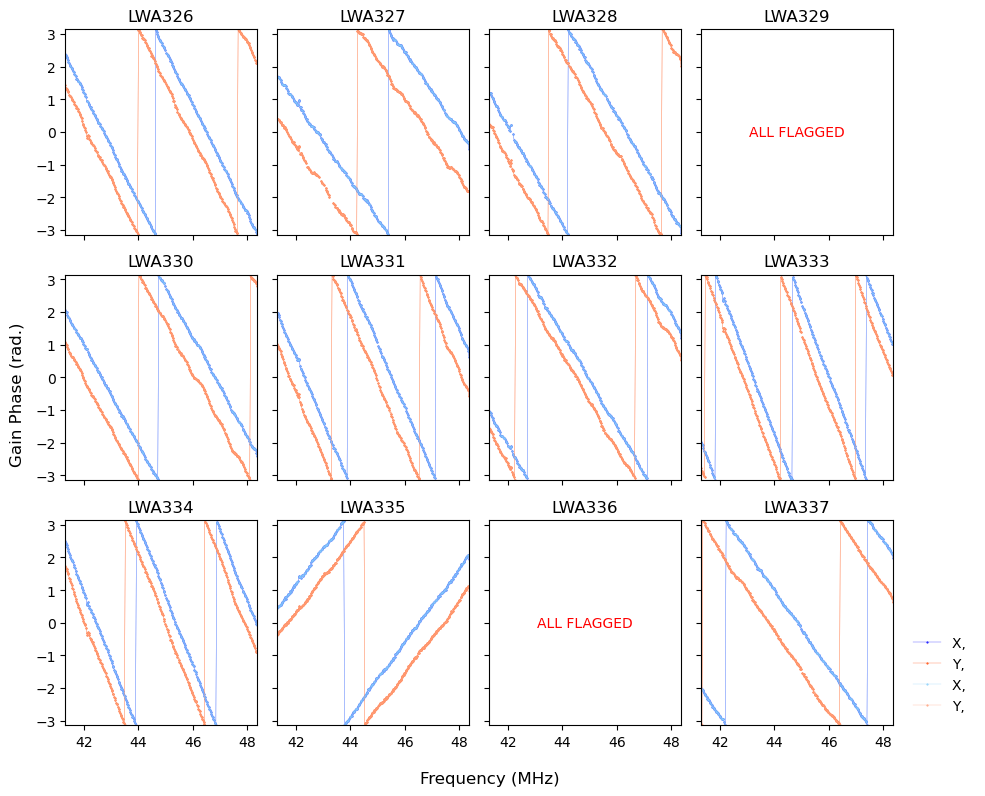

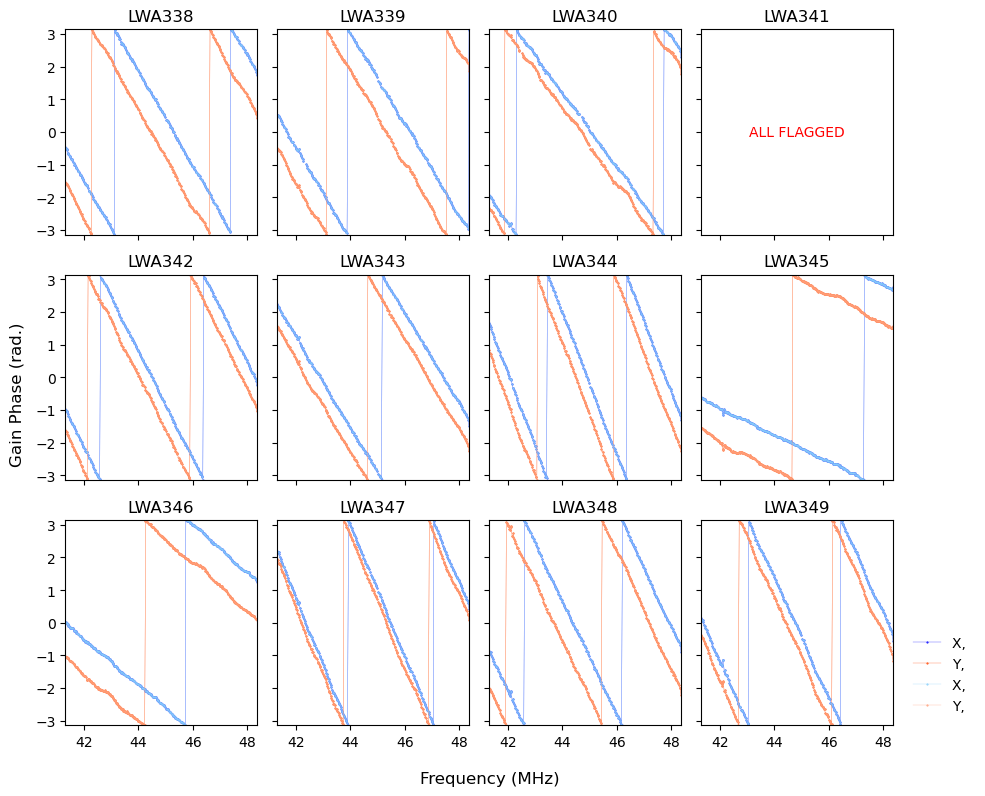

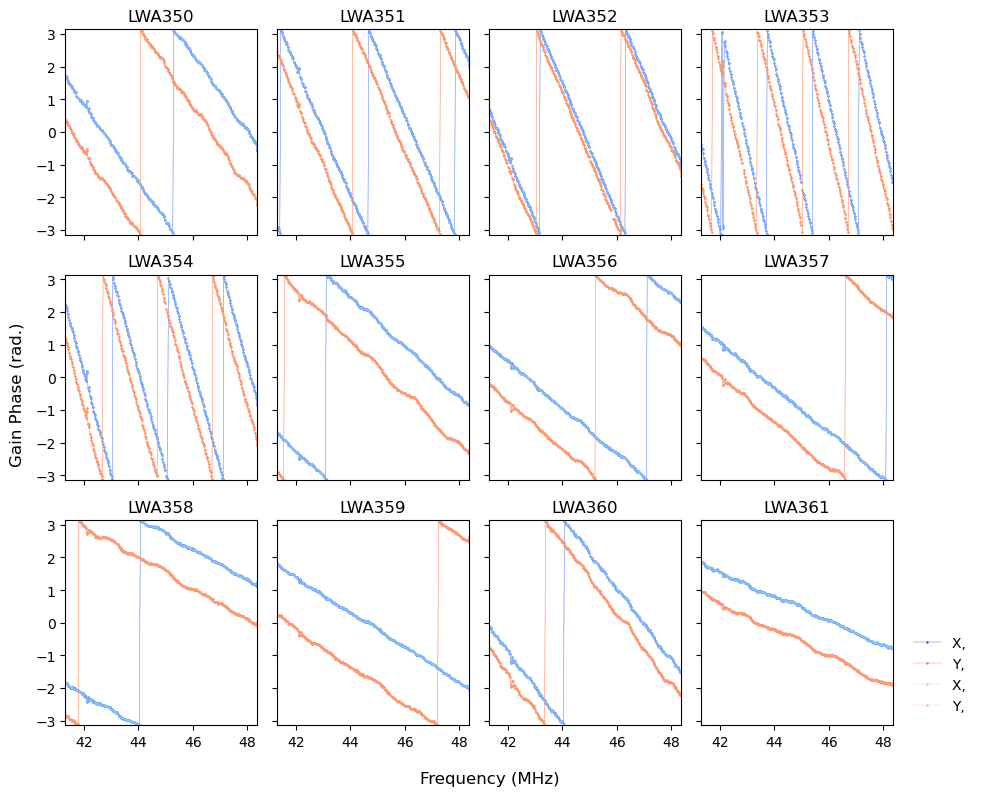

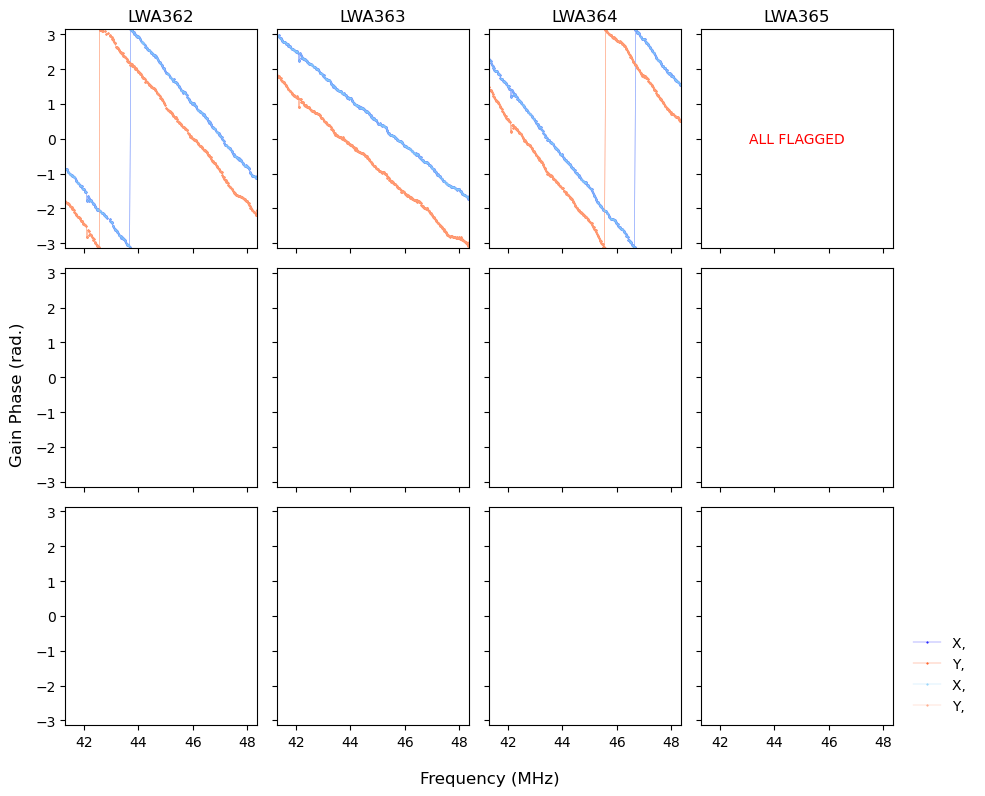

In [41]:
calibration_qa.plot_gains(cal_new, cal2=cal_orig, savefig=False)

In [44]:
cal_phase_smoothed = smooth_cal_solutions.smooth_cal(cal_new, amp_deg=None, phase_deg=1, freq_array_hz=None)

invalid value encountered in arccos


In [46]:
cal_phase_smoothed.write_calfits("/lustre/rbyrne/2026-04-19/20260419_055641-055832_44MHz_autocorr_phase_smoothed.calfits", clobber=True)

The calfits format does not support recording optional phase center, scan number, or time-varying reference antenna information, and these information will not be included in the written file.
key CASA_Version in extra_keywords is longer than 8 characters. It will be truncated to 8 as required by the calfits file format.


Mean of empty slice
Mean of empty slice


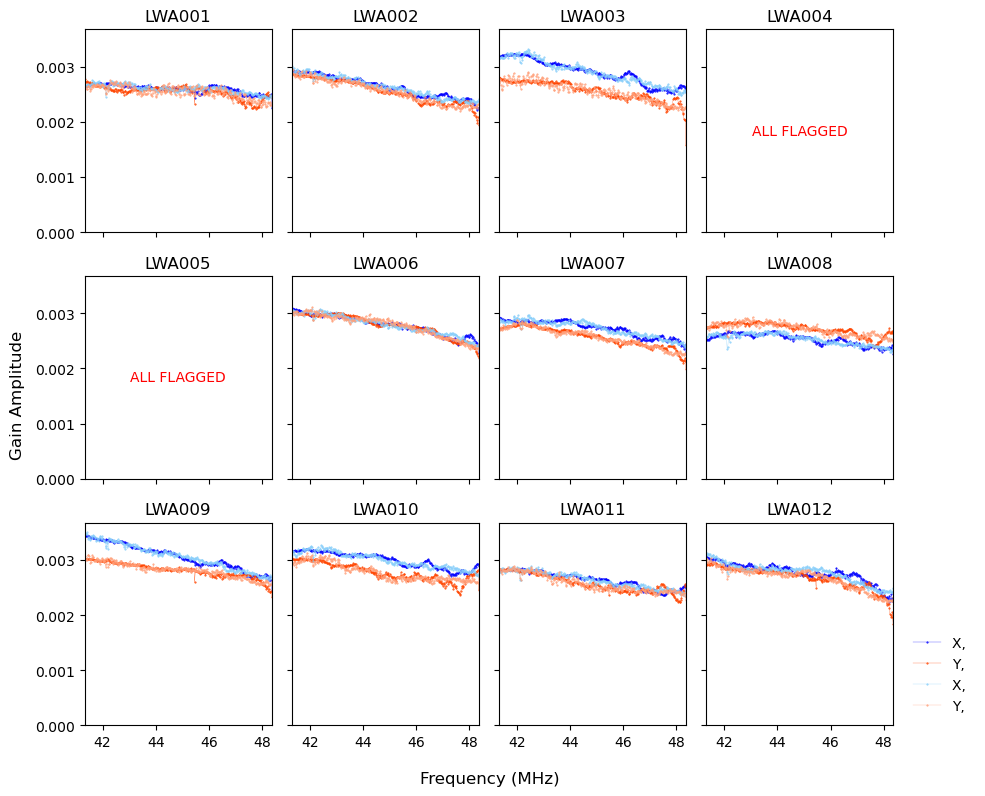

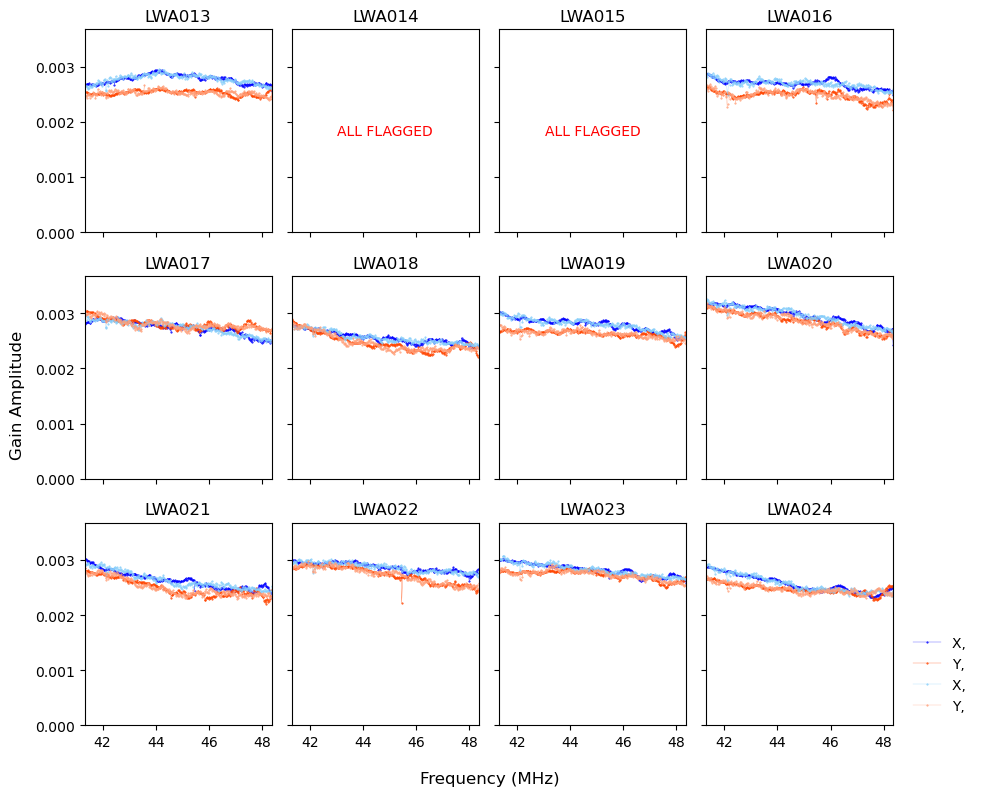

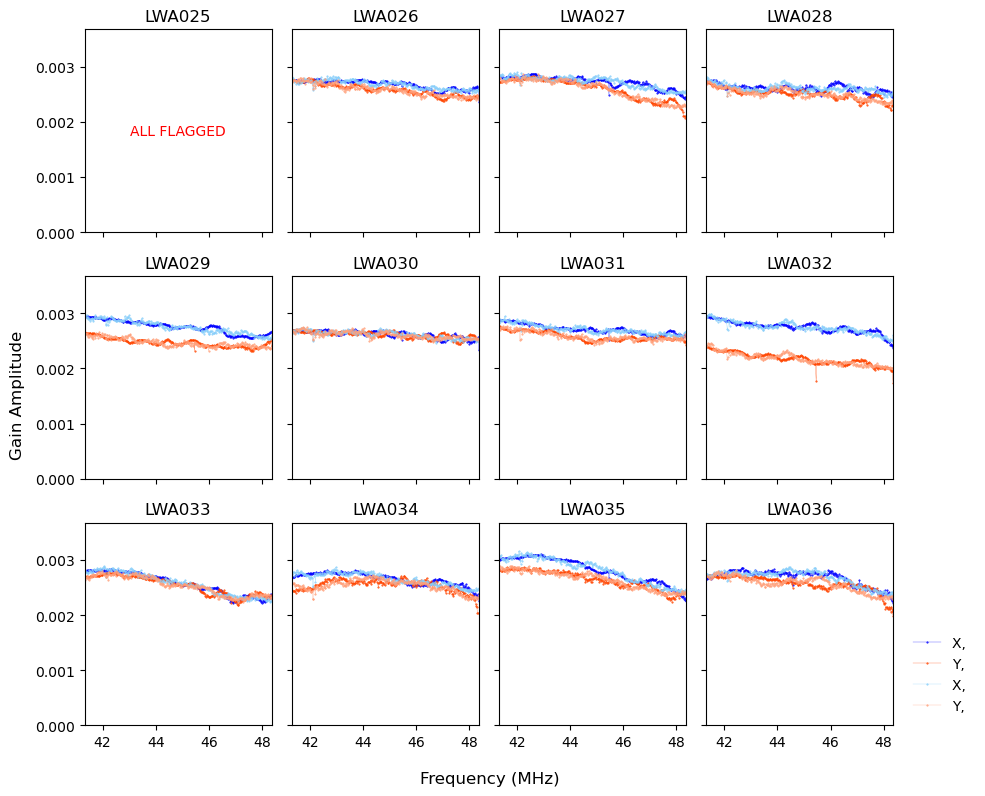

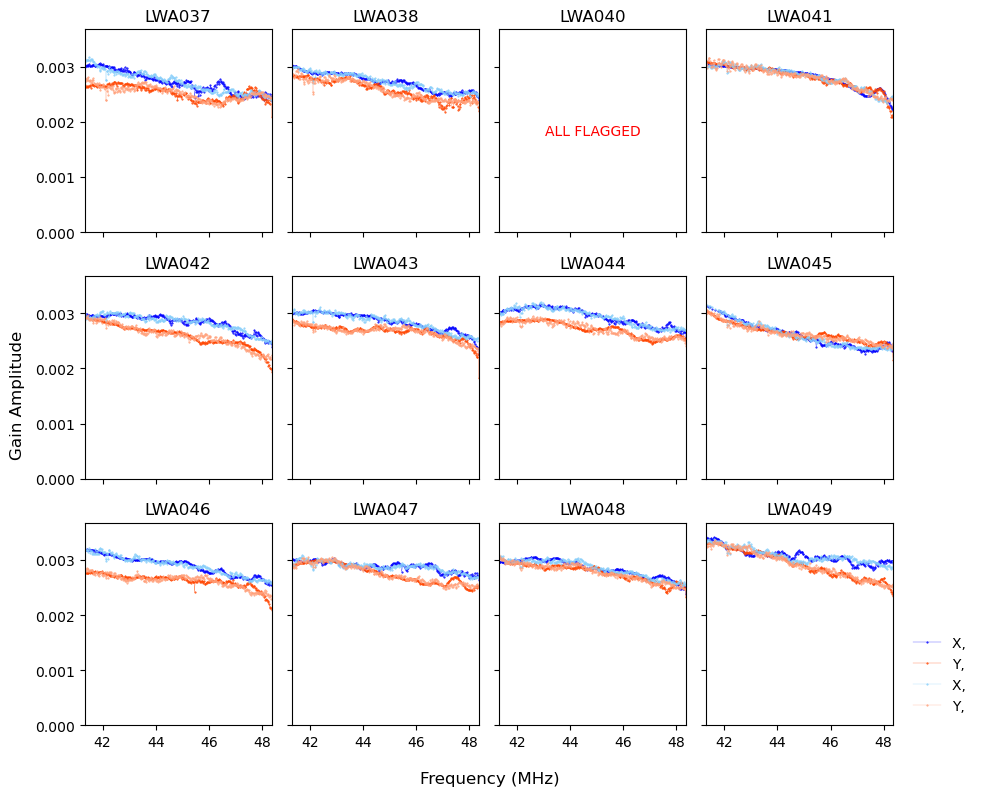

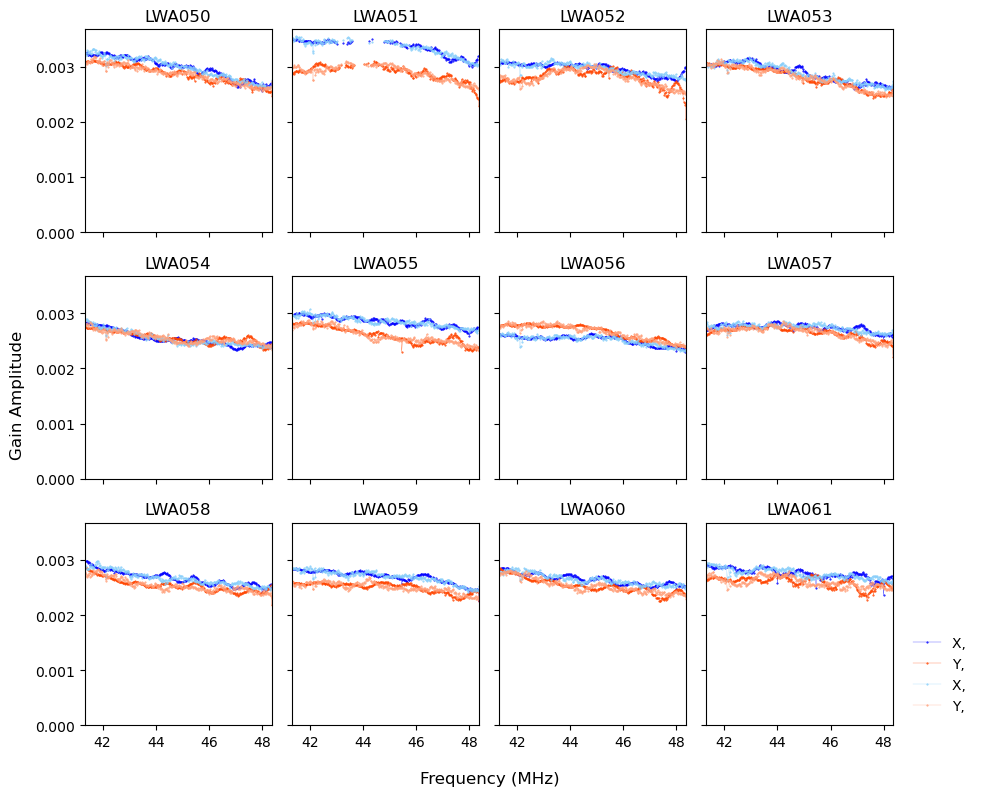

...

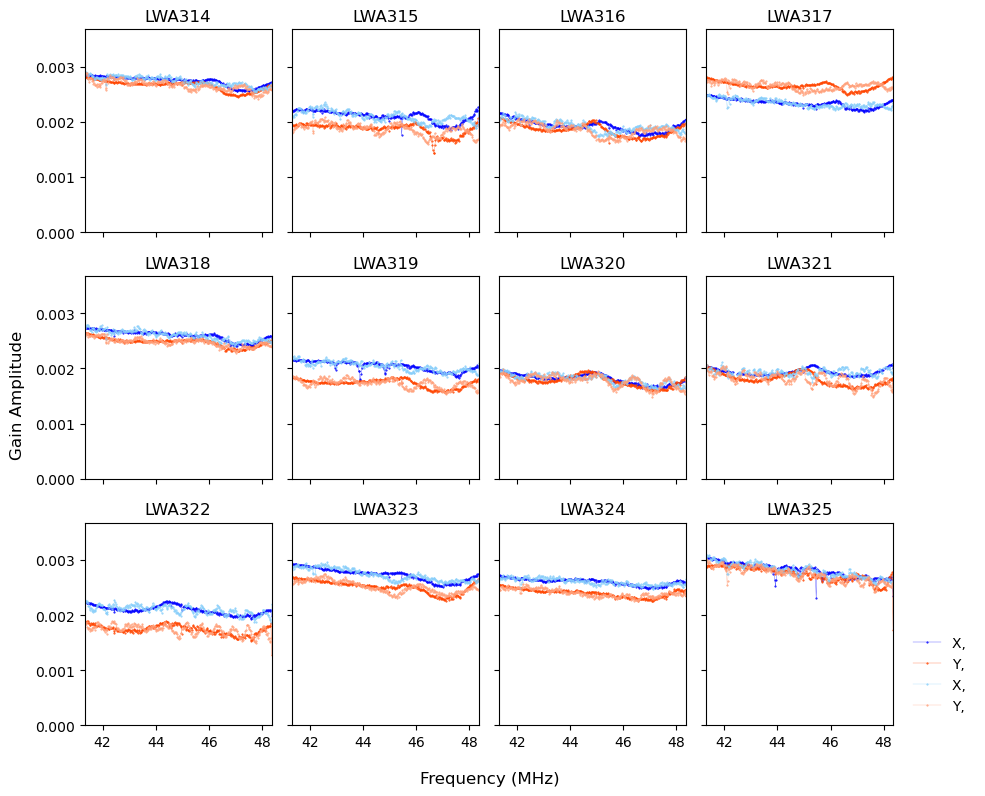

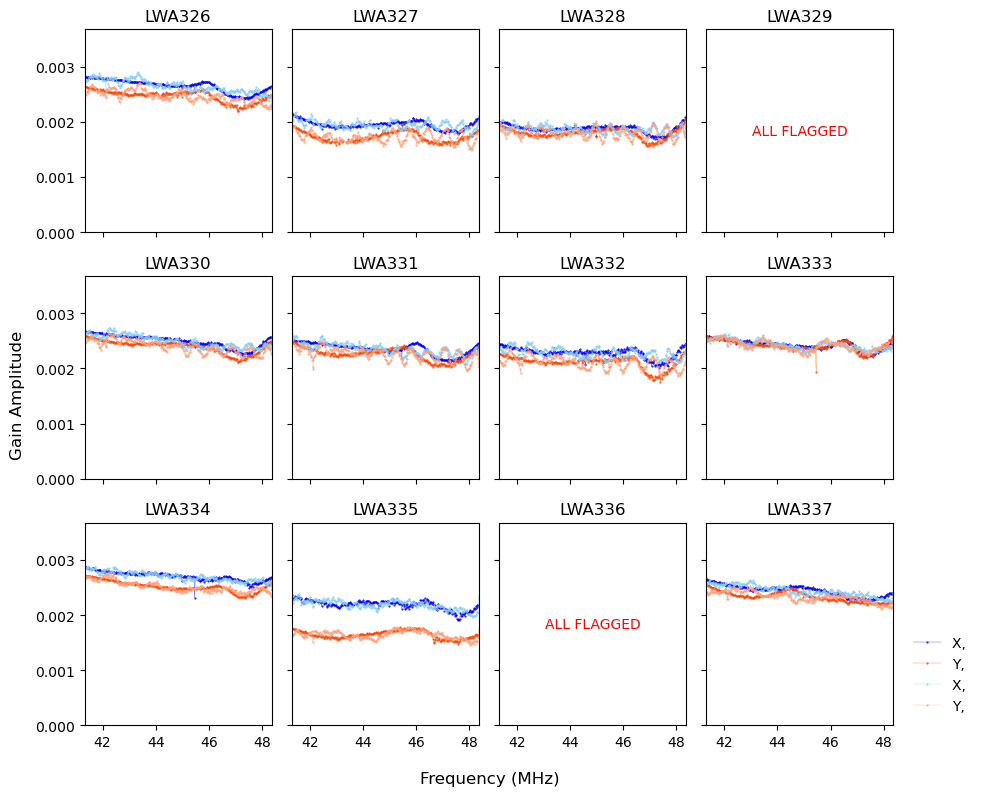

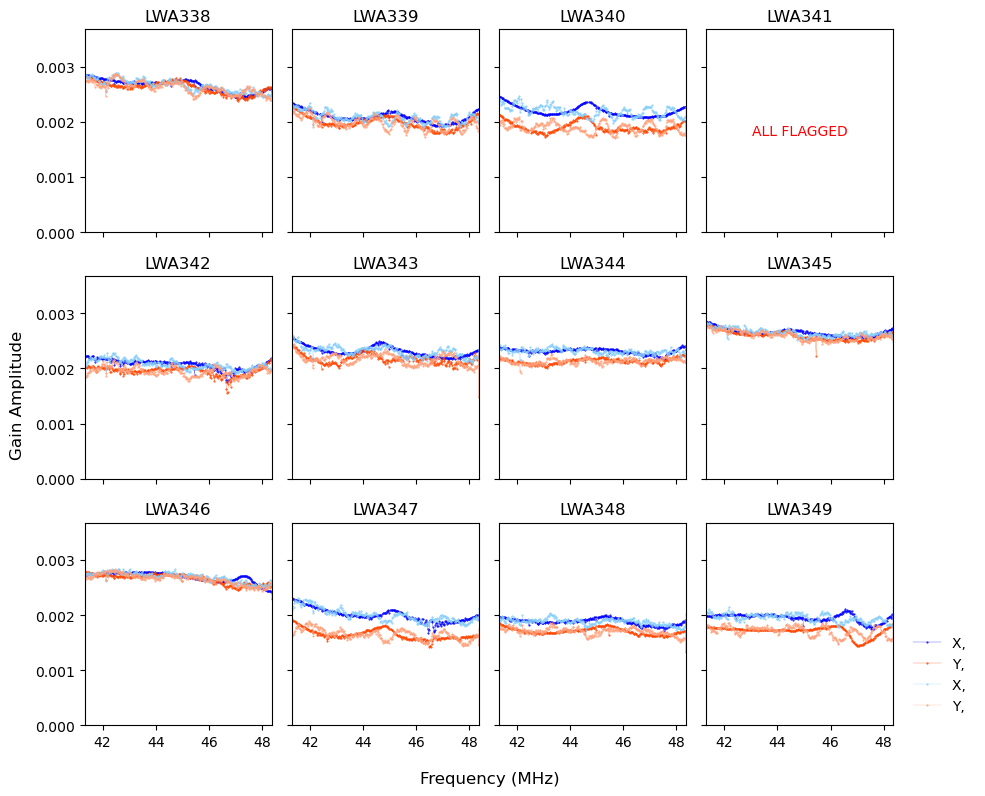

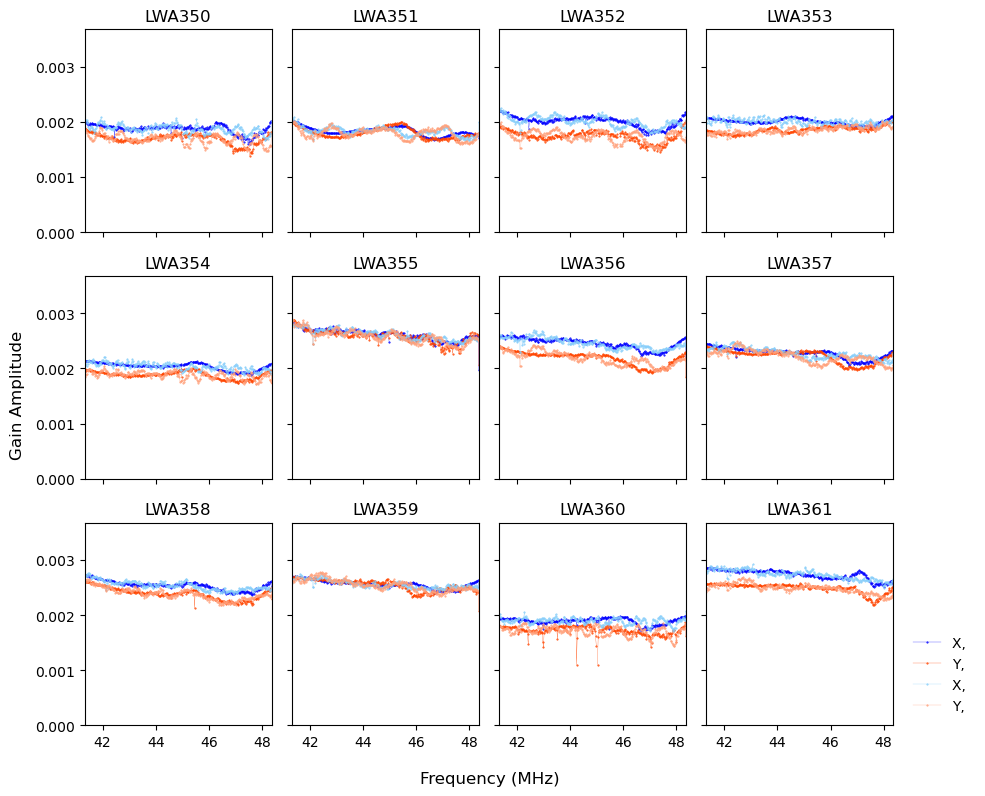

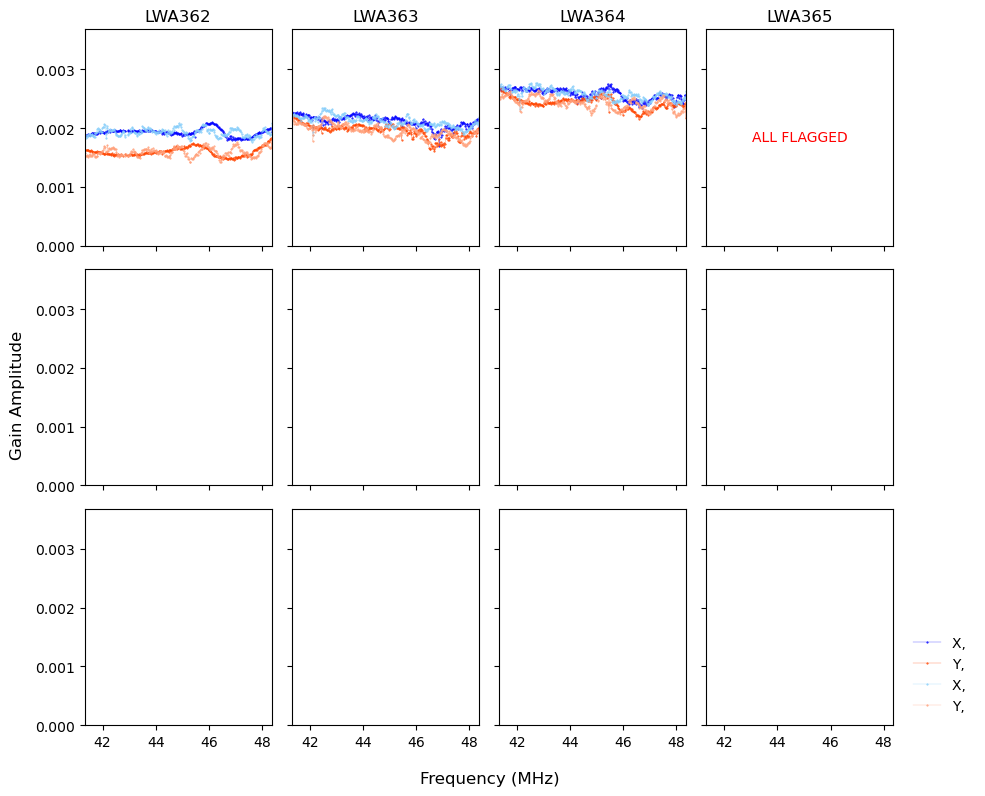

Mean of empty slice
Mean of empty slice


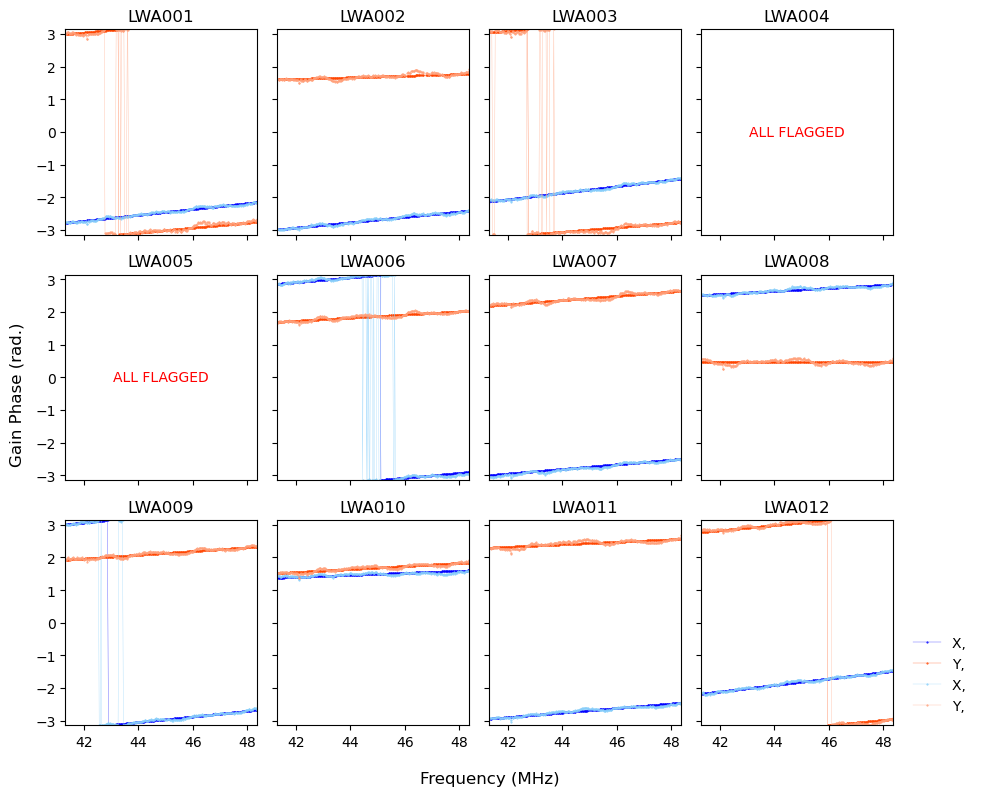

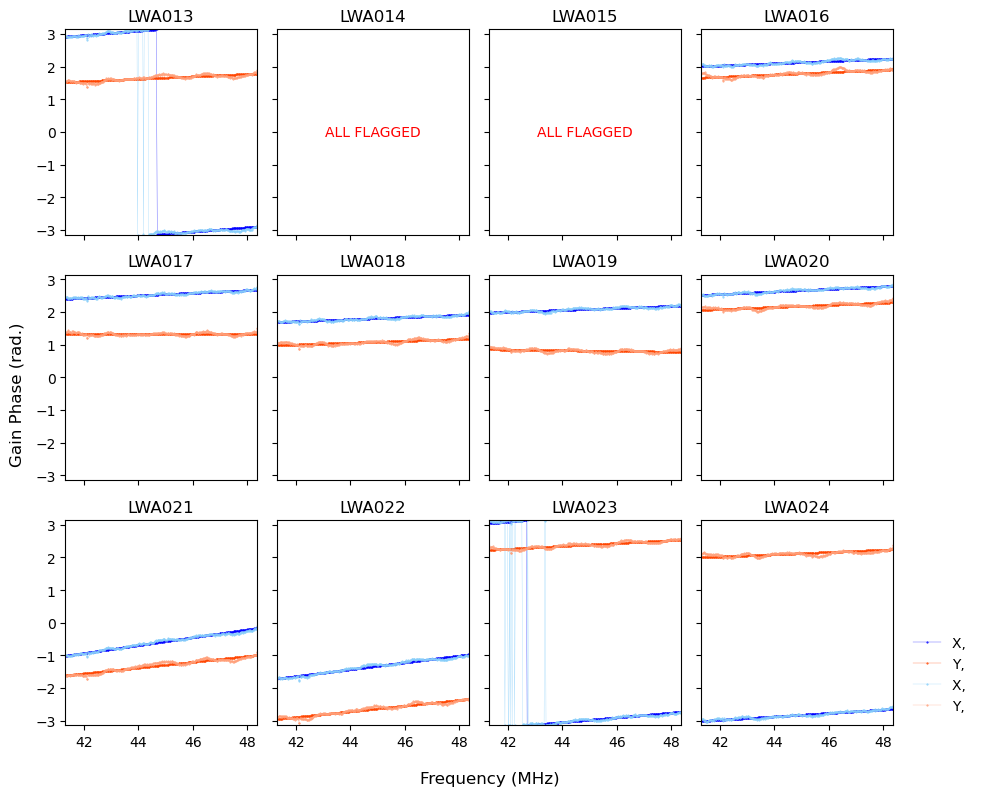

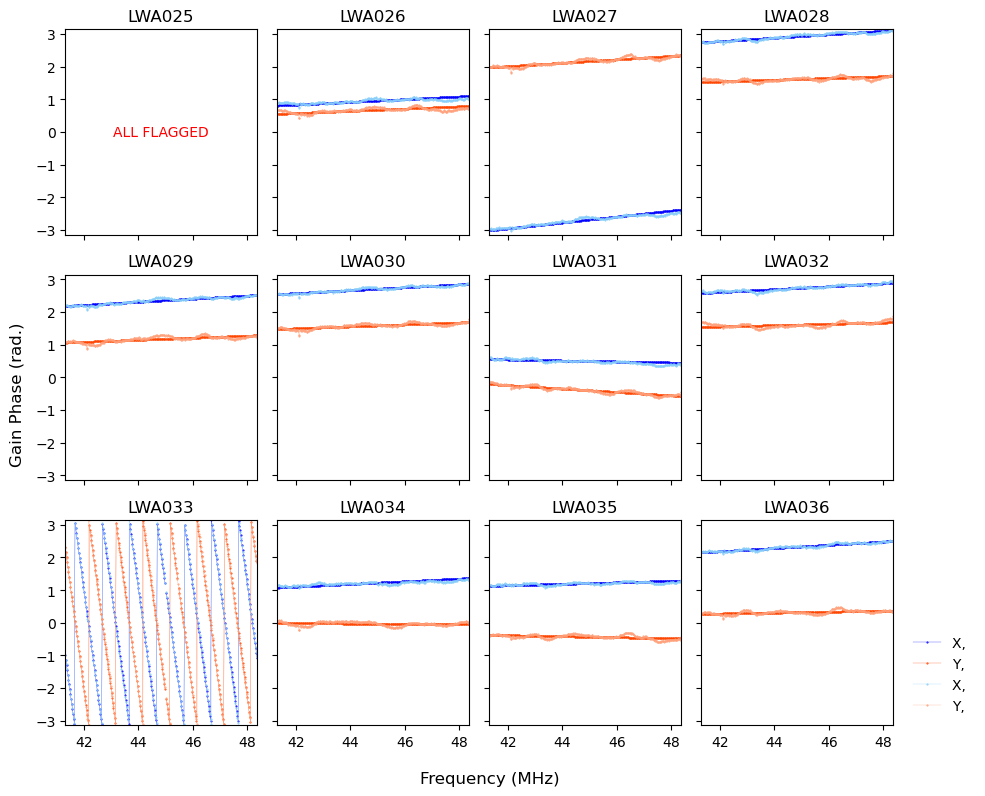

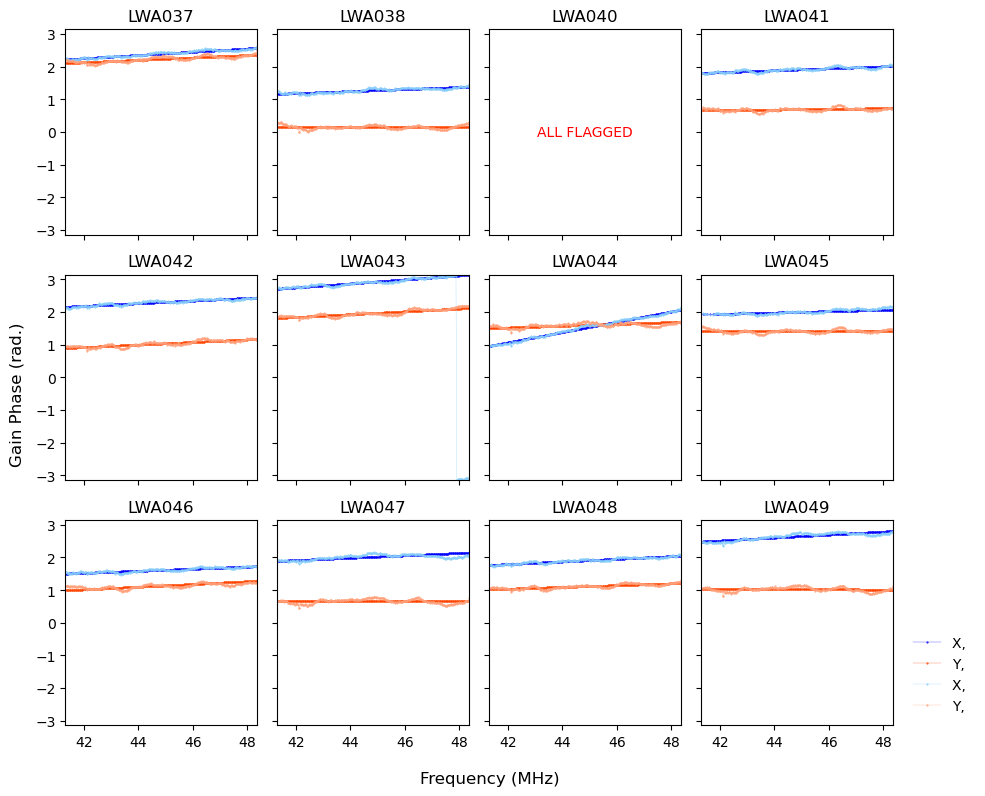

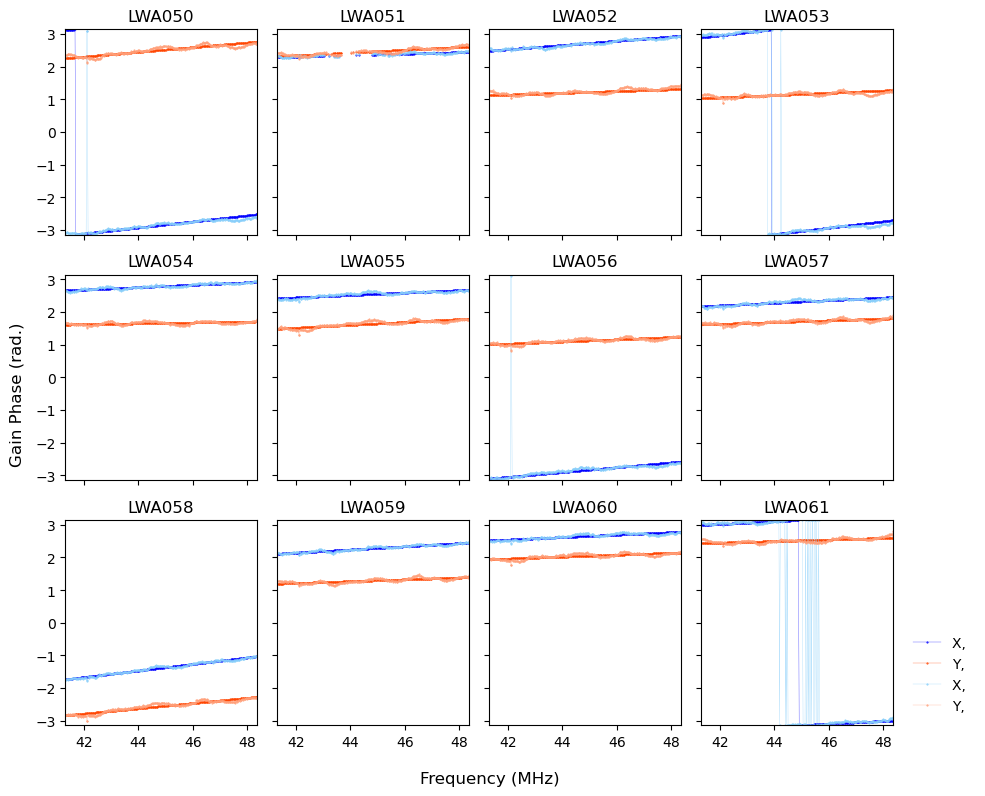

...

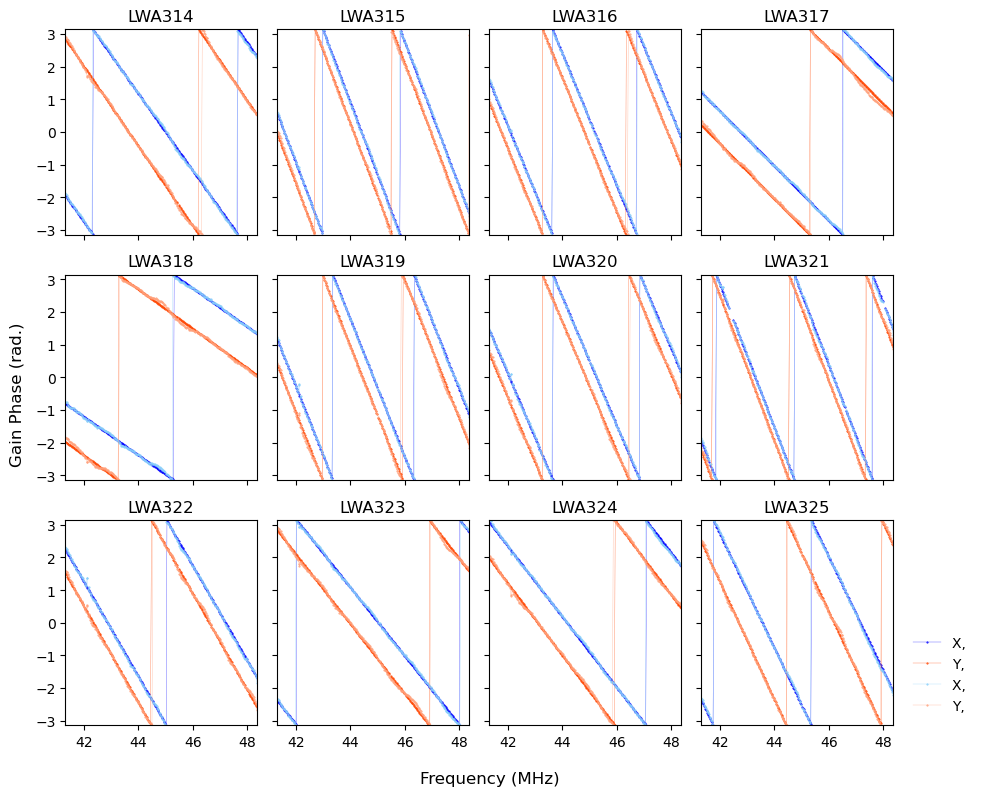

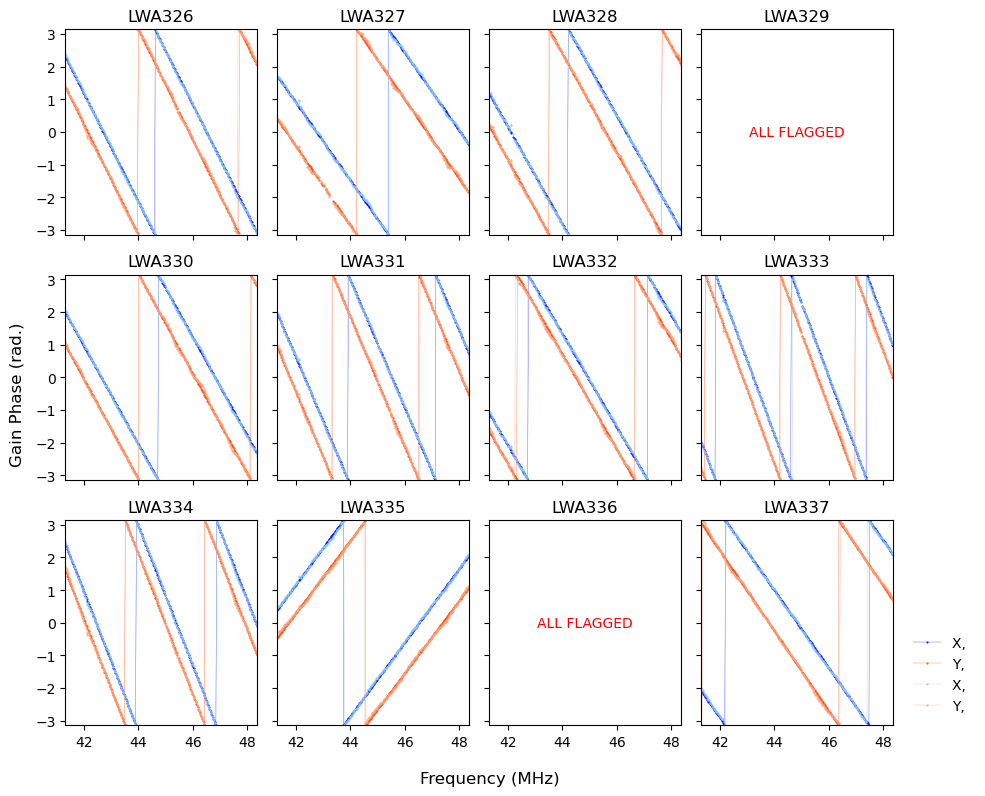

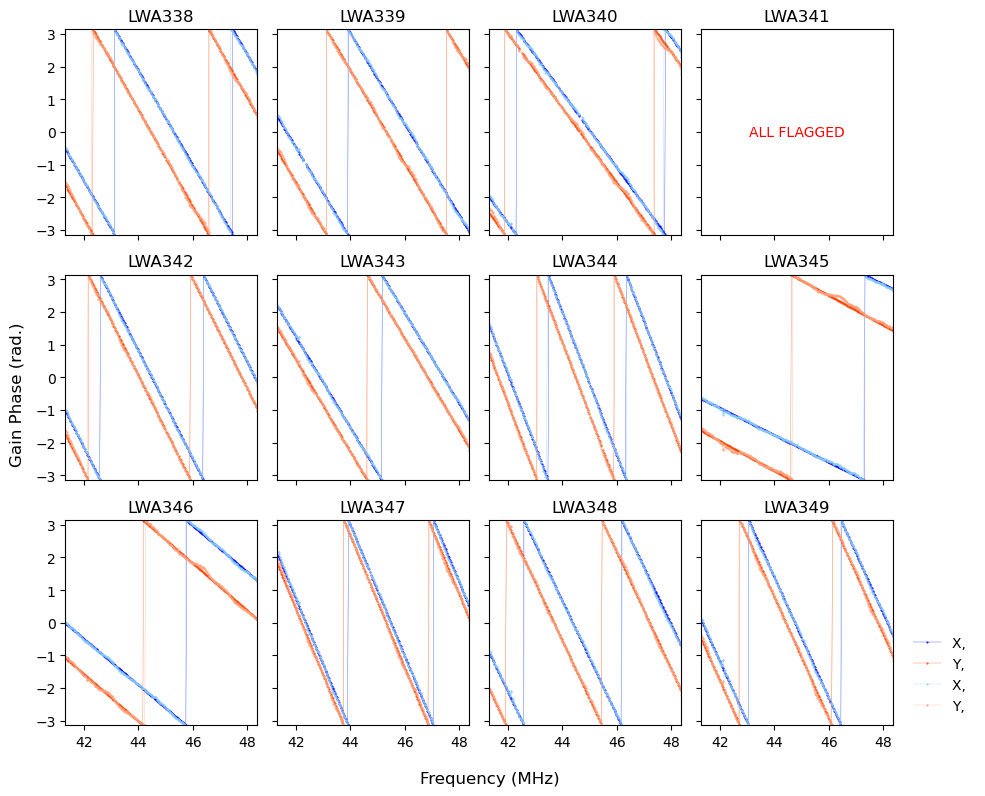

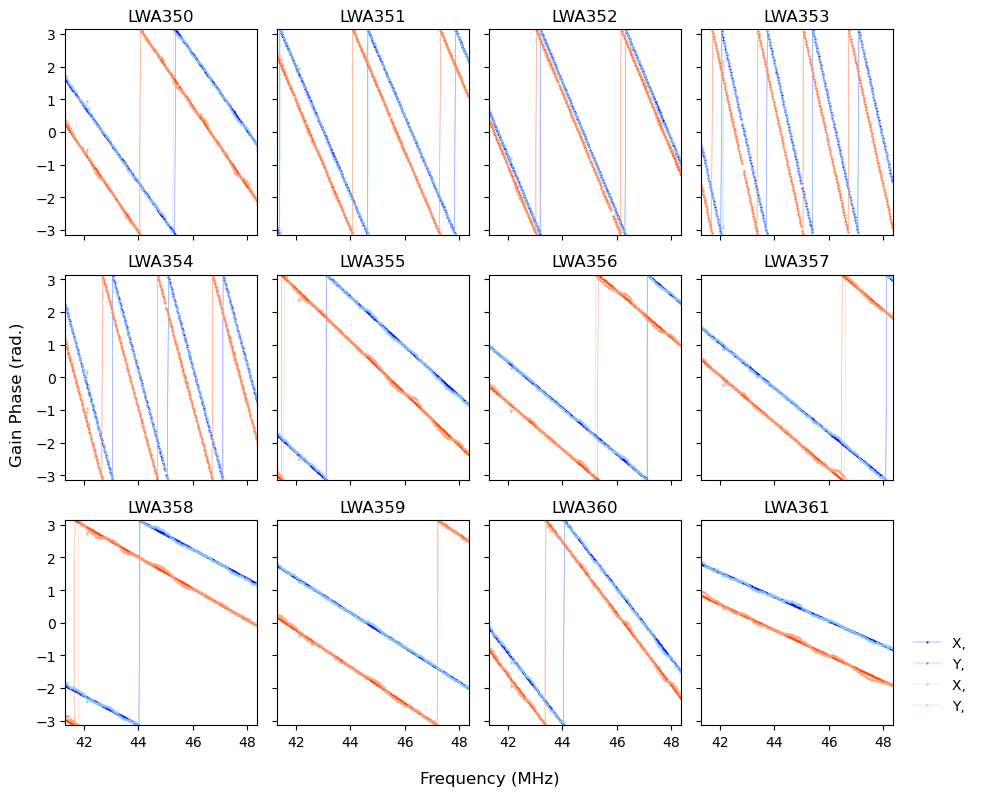

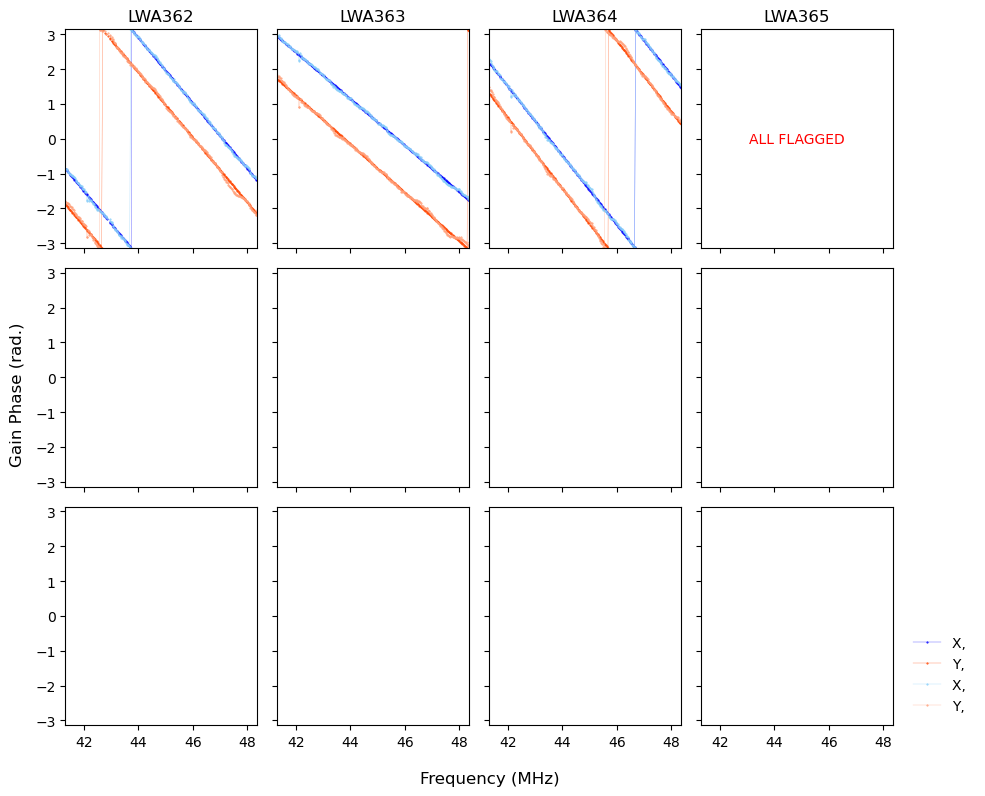

In [45]:
calibration_qa.plot_gains(cal_phase_smoothed, cal2=cal_orig, savefig=False)

In [ ]:
test_ant = "LWA276"
test_pol = -5
cal_orig.select(antenna_names=[test_ant], jones=[test_pol], frequencies=uv.freq_array)
uv.scan_number_array = None
uv.select(antenna_names=[test_ant], polarizations=[test_pol])
if uv.Ntimes > 1:
    uv.downsample_in_time(n_times_to_avg=uv.Ntimes)

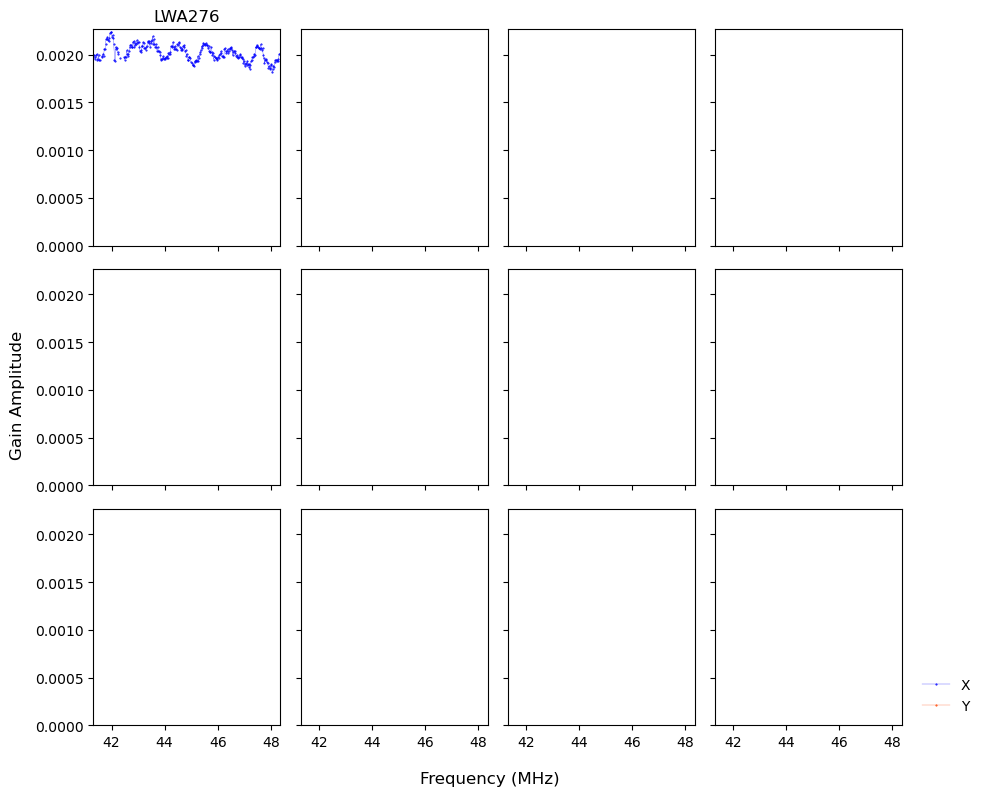

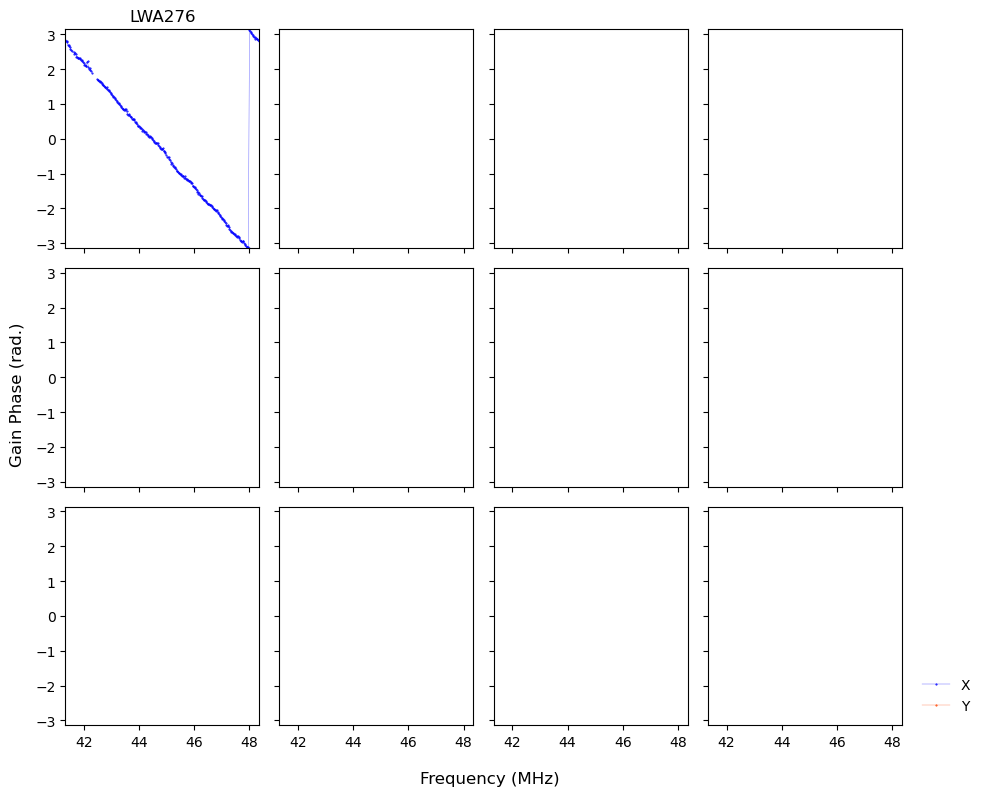

In [ ]:
calibration_qa.plot_gains(cal_orig, savefig=False)

In [ ]:
freqs = uv.freq_array / 1e6

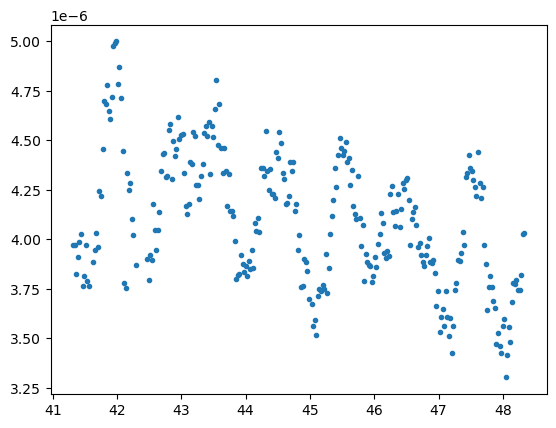

In [ ]:
plt.plot(freqs, gains_squared, ".")

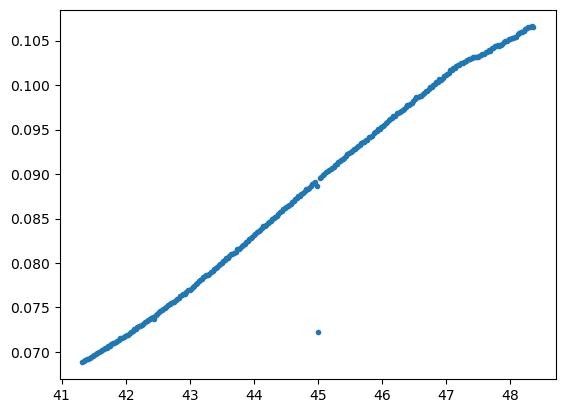

In [ ]:
plt.plot(freqs, autocorrs_inv, ".")

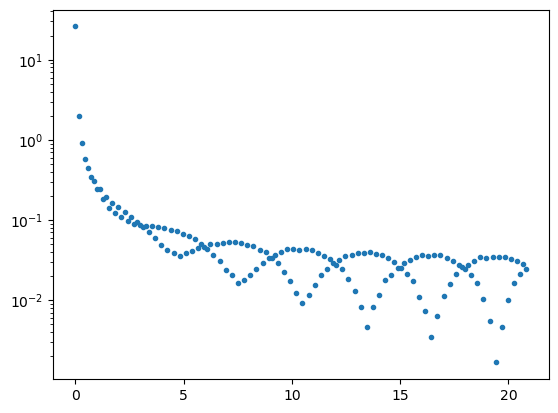

[ 2.59846478e+01+0.00000000e+00j -3.80278490e-02+1.95880926e+00j
 -4.87080850e-02+9.20903385e-01j -1.65148079e-02+5.83493888e-01j
 -3.55556272e-02+4.45120603e-01j -1.94357196e-03+3.40365618e-01j
 -2.58240812e-02+3.09068292e-01j -5.62062161e-03+2.43822590e-01j
 -2.98668388e-02+2.40234494e-01j -1.59930717e-02+1.80439740e-01j
 -2.10536234e-02+1.93943560e-01j -1.73236299e-02+1.41770408e-01j
 -1.58545282e-02+1.64888903e-01j -2.23074201e-02+1.20447107e-01j
 -1.39680486e-02+1.44424424e-01j -2.65471935e-02+1.04821518e-01j
 -7.93526601e-03+1.24539495e-01j -3.33445854e-02+9.07772854e-02j
 -4.98174923e-03+1.09158769e-01j -3.50980274e-02+8.31508487e-02j
 -2.28471821e-03+9.52424183e-02j -3.72509435e-02+7.92759880e-02j
 -9.15224839e-04+8.18964168e-02j -3.55827250e-02+7.77543113e-02j
 -3.37505946e-03+7.08581582e-02j -3.82676609e-02+7.46130794e-02j
 -3.36815114e-03+5.92031218e-02j -3.37689370e-02+7.34169856e-02j
 -6.29672455e-03+4.84524854e-02j -3.09921950e-02+7.24553391e-02j
 -9.98569280e-03+4.153350

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)


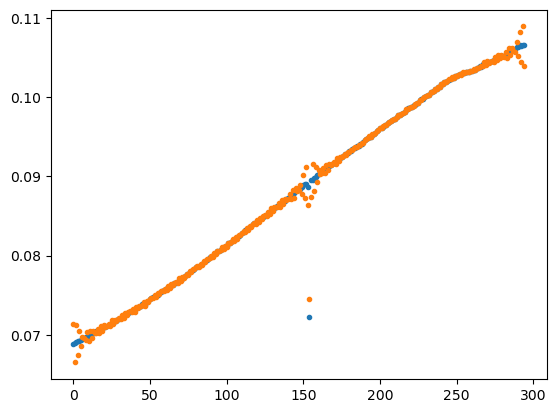

In [ ]:
autocorrs_inv_masked = autocorrs_inv.copy()
autocorrs_inv_masked[np.where(~np.isfinite(autocorrs_inv_masked))] = 0.0
autocorrs_fft = np.fft.fft(autocorrs_inv_masked)
delays = np.fft.fftfreq(len(autocorrs_inv_masked), freqs[1]-freqs[0])
pos_inds = np.where(delays >= 0)
autocorrs_fft_positive = autocorrs_fft[pos_inds]
delays_positive = delays[pos_inds]

plt.plot(delays_positive, np.abs(autocorrs_fft_positive), ".")
plt.yscale("log")
plt.show()

# Filter the highest modes
autocorrs_fft_positive[-20:] = 0
print(autocorrs_fft_positive)

autocorrs_fft_new = np.zeros_like(autocorrs_fft, dtype=complex)
for delay_ind, delay_val in enumerate(delays):
    autocorrs_fft_new[delay_ind] = autocorrs_fft_positive[np.where(delays_positive == np.abs(delay_val))]
    if delay_val < 0:
        autocorrs_fft_new[delay_ind] = np.conj(autocorrs_fft_new[delay_ind])
autocorrs_inv_new = np.fft.ifft(autocorrs_fft_new)

autocorr_inv_detrended = detrend(freqs, autocorrs_inv_masked, deg=3)
#plt.plot(autocorr_inv_detrended, ".")

plt.plot(autocorrs_inv_masked, ".")
plt.plot(autocorrs_inv_new, ".")
plt.show()

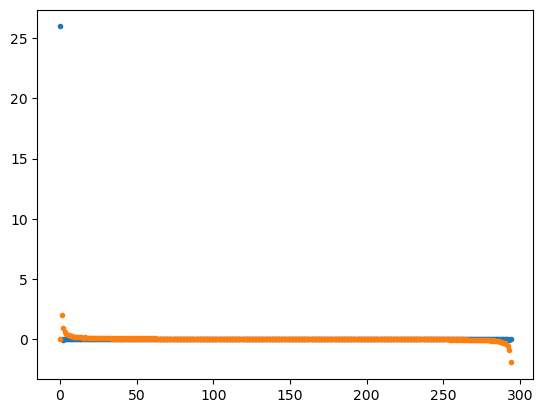

In [ ]:
plt.plot(np.real(np.fft.fft(autocorrs_inv_masked)), ".")
plt.plot(np.imag(np.fft.fft(autocorrs_inv_masked)), ".")

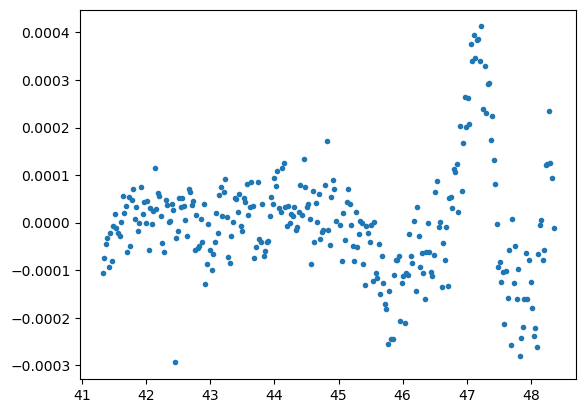

In [ ]:
autocorrs_flagged = flag(autocorrs_inv)
autocorr_inv_detrended = detrend(freqs, autocorrs_flagged, deg=3)
plt.plot(freqs, autocorr_inv_detrended, ".")

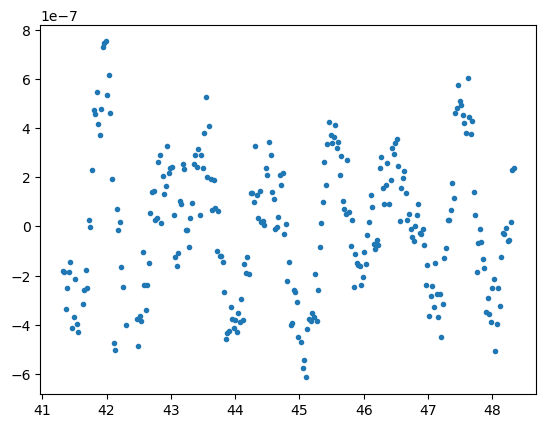

In [ ]:
gains_squared_detrended = detrend(freqs, gains_squared, deg=3)
plt.plot(freqs, gains_squared_detrended, ".")

In [ ]:
print(np.nanstd(gains_squared_detrended))
print(np.nanstd(autocorr_inv_detrended))

2.8123210017312547e-07
0.0001181435563837428


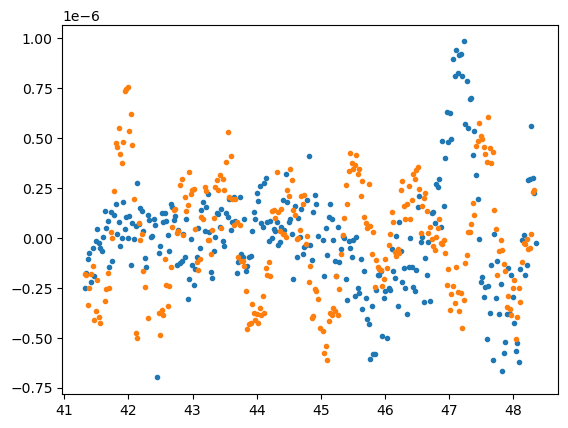

In [ ]:
autocorr_inv_detrended_rescaled = autocorr_inv_detrended*np.nanstd(gains_squared_detrended)/np.nanstd(autocorr_inv_detrended)
plt.plot(freqs, autocorr_inv_detrended_rescaled, ".")
plt.plot(freqs, gains_squared_detrended, ".")

Polyfit may be poorly conditioned


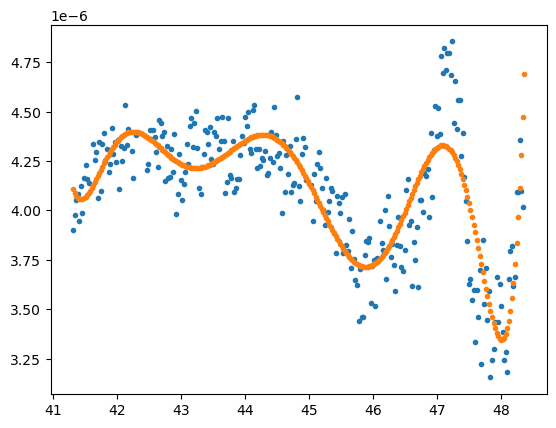

In [ ]:
gains_squared_with_autocorrs = gains_squared - gains_squared_detrended + autocorr_inv_detrended_rescaled
gains_squared_with_autocorrs_smoothed = polynomial_smooth(freqs, gains_squared_with_autocorrs, deg=10)
plt.plot(freqs, gains_squared_with_autocorrs, ".")
plt.plot(freqs, gains_squared_with_autocorrs_smoothed, ".")